In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) #Set scaling for the jupyter notebook cell width - make them bigger

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import csv
import os
import scipy.io
import pickle
import scanpy as sc
#import velocyto as vcy
import seaborn as sbn
import scipy
import scanpy.external as sce
from IPython.display import clear_output
import sys
from sklearn import preprocessing
from numpy import ones,vstack
from numpy.linalg import lstsq
from sklearn.neighbors import KNeighborsClassifier
import sklearn.neighbors as skn
import sklearn
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D

#pandora = 'X:/'
#path_scripts = os.path.join(pandora, 'karlan/Python scripts/Skin analysis/Anagen_10x/Simon analysis/scripts/')

root = '/mnt/g' if 'mnt' in os.getcwd() else 'G:'

fig_path = '{}/My Drive/MKA/Papers/Greco/Katie/Figure_output/Rebuttal'.format(root)

path_skin_scripts = '{}/My Drive/Python/Projects'.format(root)
sys.path.append(path_skin_scripts)
from Skin_scripts import *

In [4]:
sc.logging.print_versions()

-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.1
-----
PIL                                 8.3.1
Skin10X_imaging_scripts_v1_0        NA
Skin_scripts                        NA
anndata                             0.7.6
backcall                            0.2.0
cffi                                1.14.6
cloudpickle                         2.0.0
colorama                            0.4.4
cycler                              0.10.0
cython_runtime                      NA
cytoolz                             0.11.0
dask                                2021.03.0
dateutil                            2.8.2
decorator                           4.4.2
defusedxml                          0.7.1
dunamai                             1.11.1
entrypoints                         0.3
get_version                         3.2
h5py                                2.10.0
igraph                              0.9.6
immutables                          0.16
ipykernel                           5.3.4
ipython_genutil

# Load data

In [5]:
fig_path = '{}/My Drive/MKA/Papers/Greco/Katie/Figure_output'.format(root)
path = '{}/My Drive/MKA/Epidermal stem cells at the point of no return/Sequencing results/Combined_With_Joost_IFE/'.format(root)
filename = '20201008_ingest_combined_imputed_cc-regressed'
raw_filename = '20200408_ingest_combined_imputed_cc-regressed'
raw_filename_downsampled = '20200415_ingest_combined_imputed_cc-regressed_downscaled'

sc.settings.figdir = fig_path

data_magic = sc.read_loom(os.path.join(path, '{}.loom'.format(filename)), obs_names = 'obs_names')

data_magic.raw = sc.read_csv(os.path.join(path, '{}_raw_counts.csv'.format(raw_filename_downsampled)))

with open(os.path.join(path, '{}_MST.pickle'.format(raw_filename)), 'rb') as file:
    MST = pickle.load(file)
    
with open(os.path.join(path, '{}_uns.pickle'.format(filename)), 'rb') as file:
    data_magic.uns = pickle.load(file)
    
b_sb_cutoff_old = data_magic[data_magic.obs['Location'] == 'Suprabasal'].obs['pto_coords'].min()
b_sb_cutoff = 0.8725141776937618

data_magic.obs['binned_delamination'] = pd.Categorical(data_magic.obs['binned_delamination'])


/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['distances'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['connectivities'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,


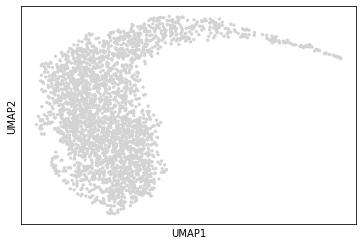

In [6]:
sc.pl.umap(data_magic)
clear_output()
sc.pl.umap(data_magic)

In [7]:
old_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
new_colors = ['#00FF00', '#FFE000', '#FF9900', '#FF3300', '#CC0000']
data_magic.uns['pred_cluster_imp_colors'] = new_colors

In [8]:
colors = data_magic.uns['pred_cluster_imp_colors']
n_colors = 11

norm=plt.Normalize(0,n_colors)
cmap = mpl.colors.LinearSegmentedColormap.from_list("", [mpl.colors.to_rgb(x) for x in colors])
m = mpl.cm.ScalarMappable(cmap=cmap, norm = norm)
#c = [mpl.colors.to_hex(m.to_rgba(x)) for x in np.append(np.arange(0,6),np.append(np.arange(n_colors-6,n_colors-4), np.arange(n_colors-2,n_colors)))]
c = [mpl.colors.to_hex(m.to_rgba(x)) for x in np.arange(0,10)]

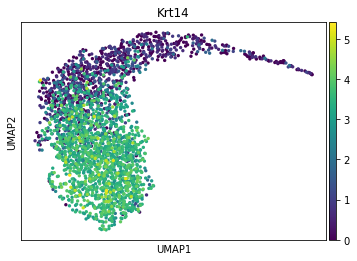

In [9]:
sc.pl.umap(data_magic, color = 'Krt14')

# Scenic

## STEP 1: Gene regulatory network inference, and generation of co-expression modules

### Phase Ia: GRN inference using the GRNBoost2 algorithm

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system. We use the counts matrix (without log transformation or further processing) from the loom file we wrote earlier. Output: List of adjacencies between a TF and its targets stored in ADJACENCIES_FNAME

In [9]:

# set variables for file paths to read from and write to:

scenic_path = '/mnt/g/My Drive/Python/Projects/Scenic'
scenic_path_v2 = '/mnt/g/My Drive/Python/Projects/Scenic/binned_delamination_10kb'

#Make paths usable for CLI based commands
scenic_path_ = scenic_path.replace(' ', '\ ')
scenic_path_v2_ = scenic_path_v2.replace(' ', '\ ')

os.chdir(scenic_path_v2)

# path to unfiltered loom file (this will be created in the optional steps below)
f_loom_path_scenic = os.path.join(scenic_path_v2, f"{filename}_unfiltered_scenic.loom")

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = os.path.join(scenic_path_v2, f"{filename}_scenic.loom")
f_loom_path_scenic_ = os.path.join(scenic_path_v2_, f"{filename}_scenic.loom")

# path to pyscenic output
f_pyscenic_output = os.path.join(scenic_path_v2, "pyscenic_output.loom")
f_pyscenic_output_ = os.path.join(scenic_path_v2_, "pyscenic_output.loom")

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = os.path.join(scenic_path_v2, f'{filename}-output.loom')
f_final_loom_ = os.path.join(scenic_path_v2_, f'{filename}-output.loom')

#TF files
f_tfs = os.path.join(scenic_path, 'mm_mgi_tfs.txt')
f_tfs_ = os.path.join(scenic_path_, 'mm_mgi_tfs.txt')

adj_csv = os.path.join(scenic_path_v2, 'adj.csv')
adj_csv_ = os.path.join(scenic_path_v2_, 'adj.csv')

reg_csv = os.path.join(scenic_path_v2, 'reg.csv')
reg_csv_ = os.path.join(scenic_path_v2_, 'reg.csv')

In [10]:
import loompy as lp
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(data_magic.var_names) ,
}
col_attrs = {
    "CellID": np.array(data_magic.obs_names) ,
    "nGene": np.array( np.sum(data_magic.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(data_magic.X.transpose() , axis=0)).flatten() ,
}
lp.create(f_loom_path_scenic, data_magic.X.transpose(), row_attrs, col_attrs)

In [11]:
tfs = pd.read_table(f_tfs, header = None, index_col = None)
tfs

,0
0,Hoxa9
1,Zfp128
2,Zfp853
3,Nr1h2
4,Nr1h3
...,...
1716,Vps72
1717,Zdhhc24
1718,Abl1
1719,Fank1


### Find new highly variable genes

In [12]:
raw_data = sc.read_csv(os.path.join(path, '{}_raw_counts.csv'.format(raw_filename)))
raw_data.obs = data_magic.obs.loc[raw_data.obs_names]
raw_data

AnnData object with n_obs × n_vars = 2646 × 20618
    obs: '10x_leiden', 'Basa-Suprabasal', 'C1_pred_cluster', 'G2M_score', 'G2M_score_separate_original', 'Ivl_cells', 'Krt10 class', 'Krt10_class_mean', 'Krt10_group', 'Krt14_group', 'Location', 'S_score', 'S_score_separate_original', '_tmp_embedding_density_column_8271_', 'batch', 'binned_delamination', 'cell_identity', 'clustering', 'dpt_binned', 'dpt_ordered', 'dpt_pseudotime', 'layer', 'leiden', 'leiden_named', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_ERCC', 'log1p_total_counts_mito', 'n_genes', 'n_genes_by_counts', 'pct_counts_ERCC', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mito', 'phase', 'phase_c0', 'phase_c0.05', 'phase_c0.1', 'phase_c0.2', 'phase_separate_original', 'pred_cluster', 'pred_cluster_ds', 'pred_cluster_imp', 'pto_coords', 'pto_coords_diffmap', 'total_counts', 'total_counts_ERCC', 'total_counts_mi

In [13]:
downsampled_data = sc.read_csv(os.path.join(path, '{}_raw_counts.csv'.format(raw_filename_downsampled)))
downsampled_data.obs = data_magic.obs.loc[downsampled_data.obs_names]
downsampled_data

AnnData object with n_obs × n_vars = 2646 × 20618
    obs: '10x_leiden', 'Basa-Suprabasal', 'C1_pred_cluster', 'G2M_score', 'G2M_score_separate_original', 'Ivl_cells', 'Krt10 class', 'Krt10_class_mean', 'Krt10_group', 'Krt14_group', 'Location', 'S_score', 'S_score_separate_original', '_tmp_embedding_density_column_8271_', 'batch', 'binned_delamination', 'cell_identity', 'clustering', 'dpt_binned', 'dpt_ordered', 'dpt_pseudotime', 'layer', 'leiden', 'leiden_named', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_ERCC', 'log1p_total_counts_mito', 'n_genes', 'n_genes_by_counts', 'pct_counts_ERCC', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mito', 'phase', 'phase_c0', 'phase_c0.05', 'phase_c0.1', 'phase_c0.2', 'phase_separate_original', 'pred_cluster', 'pred_cluster_ds', 'pred_cluster_imp', 'pto_coords', 'pto_coords_diffmap', 'total_counts', 'total_counts_ERCC', 'total_counts_mi

In [14]:
replace_dict = {'ife': 'Joost 2016', 'ivl': 'ITGA6 sorted', '10x': 'Joost 2020'}

raw_data.obs['batch'] = [x if 'Tomato' not in x else 'ivl' for x in raw_data.obs['cell_identity']]
downsampled_data.obs['batch'] = [x if 'Tomato' not in x else 'ivl' for x in downsampled_data.obs['cell_identity']]
data_magic.obs['batch'] = [x if 'Tomato' not in x else 'ivl' for x in data_magic.obs['cell_identity']]

raw_data.obs['batch'] = [replace_dict[x] for x in raw_data.obs['batch']]
downsampled_data.obs['batch'] = [replace_dict[x] for x in downsampled_data.obs['batch']]
data_magic.obs['batch'] = [replace_dict[x] for x in data_magic.obs['batch']]

data_magic.var_names = data_magic.var['var_names'].values

raw_data.uns['name'] = 'Raw'
downsampled_data.uns['name'] = 'Downsampled'
data_magic.uns['name'] = 'Final'

### Use downsampled data

In [15]:
sc.pp.filter_genes(downsampled_data, min_cells=3)
sc.pp.normalize_total(downsampled_data)
sc.pp.log1p(downsampled_data)

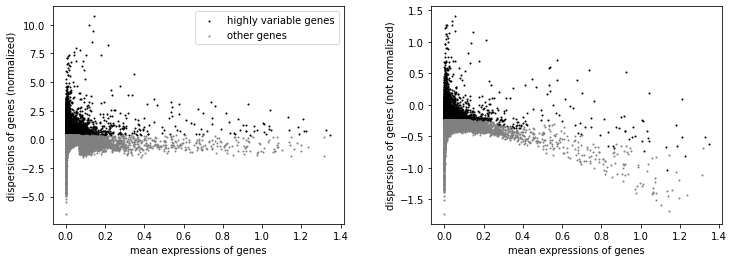

In [16]:
sc.pp.highly_variable_genes(downsampled_data, n_top_genes = 4000)
sc.pl.highly_variable_genes(downsampled_data)

In [17]:
genes = downsampled_data.var_names[downsampled_data.var['highly_variable']]
downsampled_data.raw = downsampled_data
adata = downsampled_data[:, downsampled_data.var['highly_variable']].copy()

In [18]:
import loompy as lp
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata.var_names) ,
}
col_attrs = {
    "CellID": np.array(adata.obs_names) ,
    "nGene": np.array(np.sum(adata.X.transpose()>0, axis=0)).flatten() ,
    "nUMI": np.array(np.sum(adata.X.transpose(), axis=0)).flatten() ,
}
lp.create(f_loom_path_scenic, adata.X.transpose(), row_attrs, col_attrs)

In [19]:
!pyscenic grn \
    {f_loom_path_scenic_} \
    {f_tfs_} \
    -o {adj_csv_} \
    --num_workers 20


2022-05-12 18:38:38,725 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2022-05-12 18:38:39,234 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork fro

## STEP 2-3: Regulon prediction aka cisTarget from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

Output: List of adjacencies between a TF and its targets stored in MOTIFS_FNAME.

locations for ranking databases, and motif annotations:

In [21]:
import glob
# ranking databases
f_db_glob = os.path.join(scenic_path_, "mm10__refseq-r80__10kb_up_and_down_tss.mc9nr.feather")
#f_db_glob = [os.path.join(scenic_path_, x) for x in os.listdir(scenic_path) if '.feather' in x]
#f_db_names = ' '.join(f_db_glob)
f_db_names = f_db_glob

# motif databases
f_motif_path = os.path.join(scenic_path_, "motifs-v9-nr.mgi-m0.001-o0.0.tbl")
#f_motif_path = "motifs-v9-nr.mgi-m0.001-o0.0.tbl"

In [22]:
f_db_names

'/mnt/g/My\\ Drive/Python/Projects/Scenic/mm10__refseq-r80__10kb_up_and_down_tss.mc9nr.feather'

Here, we use the --mask_dropouts option, which affects how the correlation between TF and target genes is calculated during module creation. It is important to note that prior to pySCENIC v0.9.18, the default behavior was to mask dropouts, while in v0.9.18 and later, the correlation is performed using the entire set of cells (including those with zero expression). When using the modules_from_adjacencies function directly in python instead of via the command line, the rho_mask_dropouts option can be used to control this.

##### Note

The next CLI function can give stupid/wrong error messages that a file wasn't found when the file path for another input is wrong!

In [24]:
!pyscenic ctx {adj_csv_} \
    {f_db_names} \
    --annotations_fname {f_motif_path} \
    --expression_mtx_fname {f_loom_path_scenic_} \
    --output {reg_csv_} \
    --mask_dropouts \
    --num_workers 14 \
    --auc_threshold 0.05


2022-05-12 18:52:12,066 - pyscenic.cli.pyscenic - INFO - Creating modules.

2022-05-12 18:52:12,174 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2022-05-12 18:52:12,682 - pyscenic.utils - INFO - Calculating Pearson correlations.

2022-05-12 18:52:12,705 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [True].

2022-05-12 18:52:13,474 - pyscenic.utils - INFO - Creating modules.

2022-05-12 18:52:24,810 - pyscenic.cli.pyscenic - IN

In [25]:
adjacencies = pd.read_csv(adj_csv, index_col=False, sep=',')
adjacencies.head()

,TF,target,importance
0,Hmgb2,Ube2c,225.073448
1,Hmgb2,Cenpa,200.631301
2,Hmgb2,Ccnb1,197.260919
3,Hmgb2,Cdc20,194.542092
4,Hmgb2,Birc5,194.124543


In [26]:
k10_adj = adjacencies.iloc[np.where(adjacencies['target'].values=='Krt10')[0]]
k10_adj = k10_adj[k10_adj['importance']> 10]
k10_adj

,TF,target,importance
129,Hes1,Krt10,67.834521
262,Fos,Krt10,46.693204
275,Bhlhe40,Krt10,45.857353
426,Hmgb2,Krt10,36.719555
434,Id1,Krt10,36.505305
714,Ovol1,Krt10,27.655658
1311,Klf4,Krt10,18.774304
1670,Hspa5,Krt10,15.510955
1800,Jund,Krt10,14.675757
1849,Atf3,Krt10,14.380563


## STEP 4: Cellular enrichment (aka AUCell) from CLI

It is important to check that most cells have a substantial fraction of expressed/detected genes in the calculation of the AUC. The following histogram gives an idea of the distribution and allows selection of an appropriate threshold. In this plot, a few thresholds are highlighted, with the number of genes selected shown in red text and the corresponding percentile in parentheses). See the relevant section in the R tutorial for more information.

By using the default setting for --auc_threshold of 0.05, we see that 1192 genes are selected for the rankings based on the plot below

In [27]:
nGenesDetectedPerCell = np.sum(adata.X>0, axis=1)
qs = [.01, .05, .10, .50, 1]
percentiles = np.percentile(nGenesDetectedPerCell, [x*100 for x in qs])
print(percentiles)

[109.  134.  150.  218.5 958. ]


/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


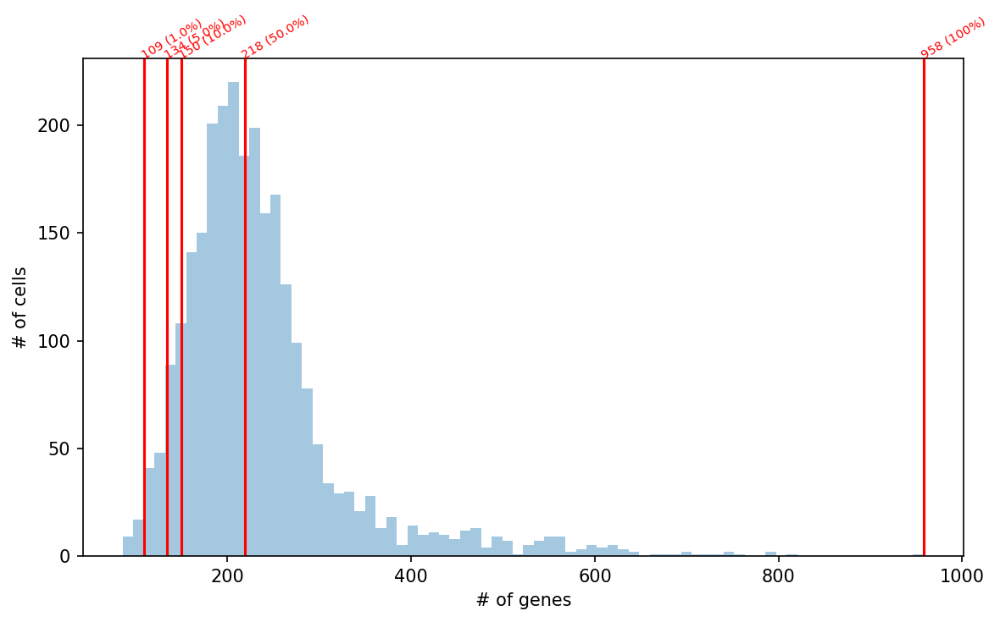

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sbn.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i,x in enumerate(percentiles):
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({qs[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

In [29]:
#reg_csv_ = os.path.join(scenic_path_v2_, 'Multirun', 'reg1.csv')
!pyscenic aucell \
    {f_loom_path_scenic_} \
    {reg_csv_} \
    --output {f_pyscenic_output_} \
    --num_workers 14 \
    --auc_threshold 0.1


2022-05-12 18:59:35,787 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2022-05-12 18:59:36,308 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.
Create regulons from a dataframe of enriched features.
Additional columns saved: []

2022-05-12 18:59:38,179 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2022-05-12 18:59:41,401 - pyscenic.cli.pyscenic - INFO - Writing results to file.


## Visualization of SCENIC's AUC matrix

First, load the relevant data from the loom we just created

In [30]:
import json
import zlib
import base64

# collect SCENIC AUCell output
#f_pyscenic_output = os.path.join(scenic_path, "pyscenic_output.loom")
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [31]:
import umap
from MulticoreTSNE import MulticoreTSNE as TSNE

# UMAP
runUmap = umap.UMAP(n_neighbors=10, min_dist=0.4, metric='correlation').fit_transform
dr_umap = runUmap( auc_mtx )
pd.DataFrame(dr_umap, columns=['X', 'Y'], index=auc_mtx.index).to_csv( os.path.join(scenic_path_v2, "scenic_umap.txt"), sep='\t')
# tSNE
tsne = TSNE( n_jobs=20 )
dr_tsne = tsne.fit_transform( auc_mtx )
pd.DataFrame(dr_tsne, columns=['X', 'Y'], index=auc_mtx.index).to_csv( os.path.join(scenic_path_v2, "scenic_tsne.txt"), sep='\t')

## Integrate the output

Here, we combine the results from SCENIC and the Scanpy analysis into a SCope-compatible loom file

In [32]:
# scenic output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( os.path.join(scenic_path,'scenic_umap.txt'), sep='\t', header=0, index_col=0 )
dr_tsne = pd.read_csv( os.path.join(scenic_path,'scenic_tsne.txt'), sep='\t', header=0, index_col=0 )
###

Fix regulon objects to display properly in SCope:

In [33]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

Concatenate embeddings (tSNE, UMAP, etc.)

In [34]:
data_magic.obsm['X_umap_aucell'] = dr_umap.loc[data_magic.obs_names]
data_magic.obsm['X_tsne_aucell'] = dr_tsne.loc[data_magic.obs_names]

... storing 'batch' as categorical


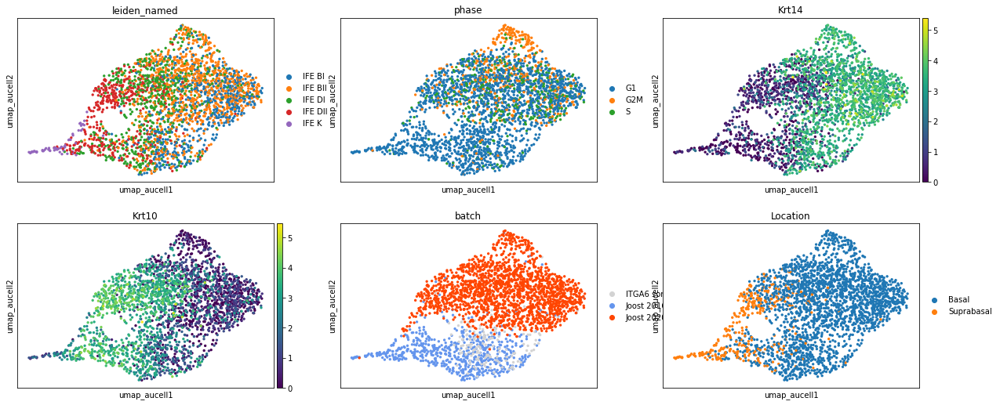

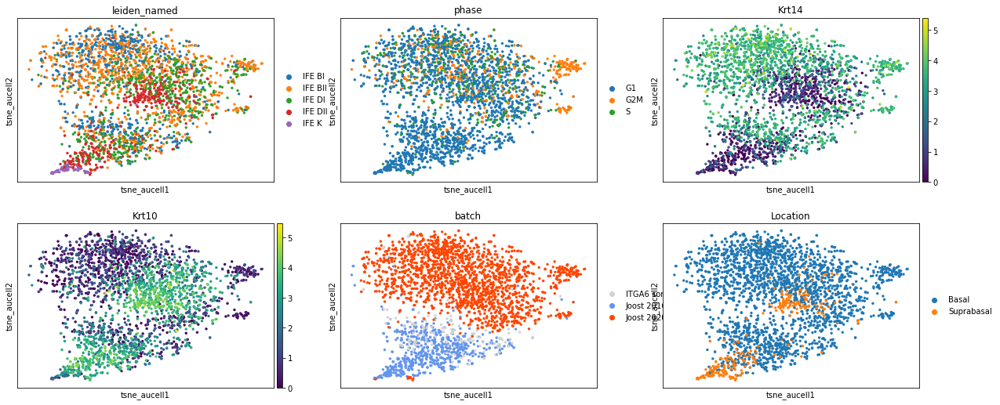

In [35]:
sc.pl.embedding(data_magic, basis = 'umap_aucell', color = ['leiden_named', 'phase', 'Krt14','Krt10', 'batch', 'Location'], ncols = 3)
sc.pl.embedding(data_magic, basis = 'tsne_aucell', color = ['leiden_named', 'phase', 'Krt14','Krt10', 'batch', 'Location'], ncols = 3)

In [37]:
tsneDF = pd.DataFrame(data_magic.obsm['X_tsne'], columns=['_X', '_Y'])

Embeddings_X = pd.DataFrame( index=lf.ca.CellID )
Embeddings_X = pd.concat( [
        pd.DataFrame(data_magic.obsm['X_umap'],index=data_magic.obs.index)[0] ,
        pd.DataFrame(data_magic.obsm['X_pca'],index=data_magic.obs.index)[0] ,
        dr_tsne['X'] ,
        dr_umap['X']
    ], sort=False, axis=1, join='outer' )
Embeddings_X.columns = ['1','2','3','4']

Embeddings_Y = pd.DataFrame( index=lf.ca.CellID )
Embeddings_Y = pd.concat( [
        pd.DataFrame(data_magic.obsm['X_umap'],index=data_magic.obs.index)[1] ,
        pd.DataFrame(data_magic.obsm['X_pca'],index=data_magic.obs.index)[1] ,
        dr_tsne['Y'] ,
        dr_umap['Y']
    ], sort=False, axis=1, join='outer' )
Embeddings_Y.columns = ['1','2','3','4']

In [38]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": -1,
        "name": f"Scanpy t-SNE (highly variable genes)"
    },
    {
        "id": 1,
        "name": f"Scanpy UMAP  (highly variable genes)"
    },
    {
        "id": 2,
        "name": "Scanpy PC1/PC2"
    },
    {
        "id": 3,
        "name": "SCENIC AUC t-SNE"
    },
    {
        "id": 4,
        "name": "SCENIC AUC UMAP"
    },
]

metaJson["clusterings"] = [{
            "id": 0,
            "group": "Scanpy",
            "name": "Scanpy leiden default resolution",
            "clusters": [],
        }]

metaJson["metrics"] = [
        {
            "name": "nUMI"
        }, {
            "name": "nGene"
        }, {
            "name": "Percent_mito"
        }
]

metaJson["annotations"] = [
    {
        "name": "Louvain_clusters_Scanpy",
        "values": list(set( adata.obs['leiden'].astype(np.str) ))
    },
    {
        "name": "binned_delamination",
        "values": list(set(adata.obs['binned_delamination'].values))
    },
    #{
    #    "name": "Timepoint",
    #    "values": list(set(adata.obs['Timepoint'].values))
    #},
    #{
    #    "name": "Sample",
    #    "values": list(set(adata.obs['Sample'].values))
    #}
]

# SCENIC regulon thresholds:
metaJson["regulonThresholds"] = rt

for i in range(max(set([int(x) for x in adata.obs['leiden']])) + 1):
    clustDict = {}
    clustDict['id'] = i
    clustDict['description'] = f'Unannotated Cluster {i + 1}'
    metaJson['clusterings'][0]['clusters'].append(clustDict)
    
clusterings = pd.DataFrame()
clusterings["0"] = adata.obs['leiden'].values.astype(np.int64)

In [39]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [40]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
    "nUMI": np.array(adata.obs['total_counts'].values),
    "nGene": np.array(adata.obs['n_genes'].values),
    "Leiden_clusters_Scanpy": np.array( adata.obs['leiden'].values ),
    "Named_cluster": np.array(adata.obs['leiden_named'].values),
    "binned_delamination": np.array(adata.obs['binned_delamination'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
    "Percent_mito": np.array(adata.obs['pct_counts_mito'].values),
    "Embedding": dfToNamedMatrix(tsneDF),
    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
    "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
    "Clusterings": dfToNamedMatrix(clusterings),
    "ClusterID": np.array(adata.obs['leiden'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [41]:
lp.create(
    filename = f_final_loom ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

# Downstream Scenic

In [42]:
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures

In [43]:
sc.logging.print_versions()

-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.1
-----
MulticoreTSNE                       NA
PIL                                 8.3.1
Skin10X_imaging_scripts_v1_0        NA
Skin_scripts                        NA
anndata                             0.7.6
attr                                21.4.0
backcall                            0.2.0
boltons                             NA
cffi                                1.14.6
cloudpickle                         2.0.0
colorama                            0.4.4
ctxcore                             0.1.1
cycler                              0.10.0
cython_runtime                      NA
cytoolz                             0.11.0
dask                                2021.03.0
dateutil                            2.8.2
decorator                           4.4.2
defusedxml                          0.7.1
dunamai                             1.11.1
entrypoints                         0.3
frozendict                          2.3.2
fsspec            

In [44]:
f_final_loom = os.path.join(scenic_path_v2, f'{filename}-output.loom')

## Extract relevant data from the integrated loom file

In [45]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [46]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [47]:
# cell annotations from the loom column attributes:
cellAnnot = pd.concat(
    [
        pd.DataFrame( lf.ca.Named_cluster, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Leiden_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.binned_delamination, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
    'Named_cluster',
    'ClusterID',
    'Leiden_clusters_Scanpy',
    'binned_delamination',
    'Percent_mito',
    'nGene',
    'nUMI']

In [48]:
# capture embeddings:
dr = [
    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [49]:
lf.close()

## Alternately, we can load this data into a scanpy.AnnData object

This can be done directly from the integrated loom file, with a few modifications to allow for SCENIC- and SCope-specific loom attributes:

We can also add all metadata derived from SCENIC to the scanpy.AnnData object.

# Display a motifs table with motif logos

## View the motifs table along with motif logos

In [50]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [51]:
#reg_csv = os.path.join(scenic_path_v2, 'reg.csv')
df_motifs = load_motifs(reg_csv)

In [52]:
selected_motifs = ['Bcl3', 'Hes1','Klf2','Klf3','Mxd1','Ovol', 'Pml', 'Sox6','Zfp110','Zfp341','Zfp64']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [53]:
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False),top_target_genes = 3)

# Dimensionality reduction plots

## Show both highly variable genes and SCENIC UMAP plots with Leiden clustering and cell type classifications

# Regulon specificity scores (RSS) across predicted cell types

In [54]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

## Calculate RSS

In [55]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['binned_delamination'])
rss_cellType

,AI987944_(+),Arntl_(+),Ascl2_(+),Atf1_(+),Atf3_(+),Atf6b_(+),Bcl3_(+),Bhlhe40_(+),Bhlhe41_(+),Brf1_(+),...,Vdr_(+),Zfp110_(+),Zfp14_(+),Zfp219_(+),Zfp524_(+),Zfp579_(+),Zfp580_(+),Zfp597_(+),Zfp951_(+),Zfp963_(+)
4.0,0.311981,0.297960,0.294321,0.300196,0.308550,0.303951,0.307113,0.304129,0.261488,0.293715,...,0.233072,0.307195,0.219938,0.312612,0.228515,0.273227,0.276391,0.267442,0.200380,0.274813
1.0,0.307625,0.305685,0.295508,0.308516,0.313979,0.304208,0.325635,0.322203,0.264270,0.347320,...,0.258572,0.311722,0.249866,0.315804,0.249854,0.330266,0.291315,0.293716,0.205018,0.343335
3.0,0.305137,0.296557,0.299089,0.300319,0.310693,0.304088,0.308797,0.306209,0.264802,0.298039,...,0.230217,0.306672,0.228114,0.319984,0.225730,0.298772,0.275799,0.286207,0.181184,0.305110
2.0,0.298717,0.308239,0.291021,0.306320,0.312519,0.304229,0.319287,0.313657,0.249785,0.301405,...,0.222967,0.305899,0.232672,0.315969,0.249155,0.314622,0.287437,0.285998,0.189005,0.318078
5.0,0.295412,0.292333,0.303412,0.291264,0.307364,0.309868,0.302082,0.300046,0.282997,0.283231,...,0.233863,0.305413,0.217898,0.308713,0.243301,0.252979,0.270114,0.271151,0.185837,0.240445
6.0,0.294019,0.285881,0.309687,0.279678,0.307112,0.316867,0.300971,0.303759,0.304931,0.281966,...,0.246305,0.308304,0.216866,0.297557,0.229981,0.248996,0.267166,0.270280,0.197763,0.231476
7.0,0.202254,0.209979,0.220321,0.205143,0.212337,0.217868,0.208658,0.214451,0.206456,0.203883,...,0.188572,0.210517,0.194991,0.206804,0.180904,0.209996,0.219980,0.211794,0.194528,0.195835
8.0,0.199101,0.205981,0.220643,0.200055,0.211732,0.218185,0.208707,0.214474,0.212250,0.201342,...,0.188474,0.211548,0.184567,0.197023,0.188549,0.204983,0.209480,0.216616,0.194243,0.187997
9.0,0.202650,0.205216,0.214109,0.203649,0.212202,0.218834,0.209451,0.214286,0.208591,0.198082,...,0.187841,0.213602,0.176006,0.196652,0.183637,0.214463,0.218484,0.207764,0.182004,0.193322
10.0,0.202523,0.207561,0.206937,0.199689,0.212682,0.212650,0.207094,0.208788,0.225810,0.198327,...,0.199718,0.217747,0.176976,0.188840,0.185519,0.196264,0.216515,0.180750,0.184529,0.203163


## RSS panel plot with all cell types

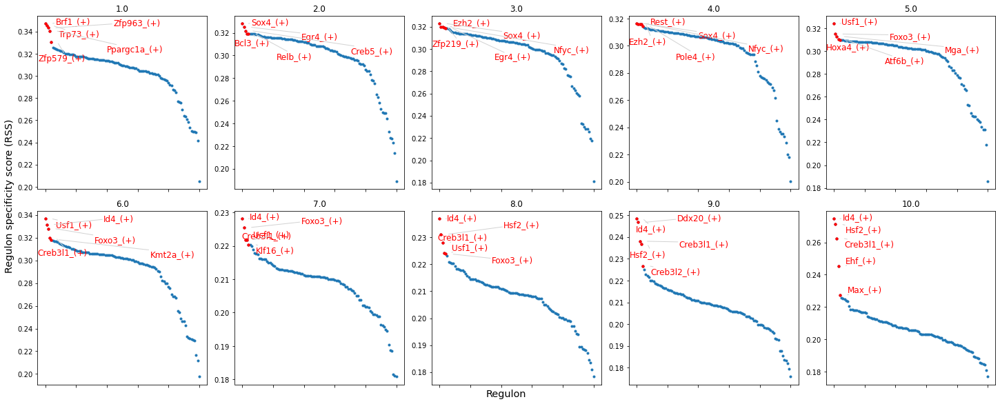

In [56]:
cats = sorted(list(set(cellAnnot['binned_delamination'])))

fig = plt.figure(figsize=(20, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )

fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [58]:
adjacencies

,TF,target,importance
0,Hmgb2,Ube2c,2.250734e+02
1,Hmgb2,Cenpa,2.006313e+02
2,Hmgb2,Ccnb1,1.972609e+02
3,Hmgb2,Cdc20,1.945421e+02
4,Hmgb2,Birc5,1.941245e+02
...,...,...,...
327119,Snai2,Igfn1,5.123169e-21
327120,Hoxb2,Ceacam1,4.548607e-21
327121,Ahr,Trim66,3.508739e-21
327122,Zfp639,Atxn7l2,1.922812e-21


In [71]:
dif_tfs = adjacencies[adjacencies['target'].isin(['Krt10','Krtdap', 'Krt1','Krt2','Sbsn','Susd2'])]
dif_tfs = dif_tfs[dif_tfs['importance']>10]
tfs = set(dif_tfs['TF'])
tfs

{'Arg1',
 'Atf3',
 'Bhlhe40',
 'Cebpb',
 'Csnk2b',
 'Egr2',
 'Ezr',
 'Fos',
 'Gata3',
 'Hes1',
 'Hmgb2',
 'Hspa5',
 'Id1',
 'Junb',
 'Jund',
 'Klf2',
 'Klf4',
 'Klf9',
 'Ovol1',
 'Rbm3',
 'Rps4x',
 'Trp63'}

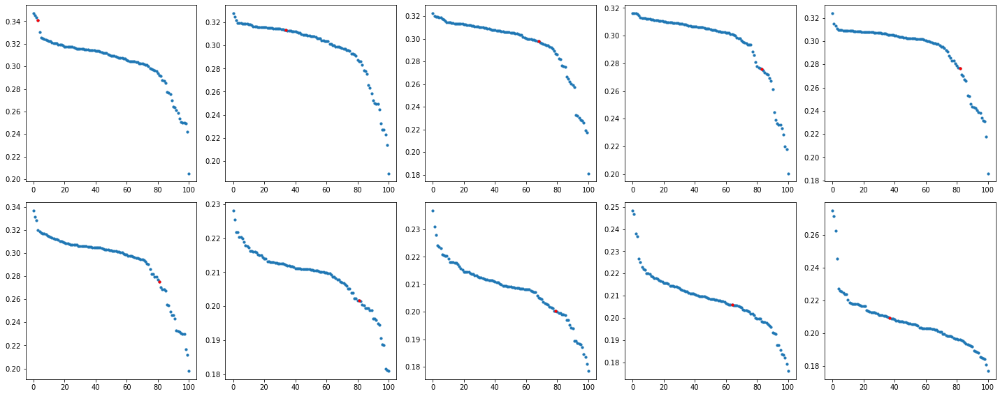

In [80]:
cats = sorted(list(set(cellAnnot['binned_delamination'])))

fig = plt.figure(figsize=(20, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=pd.DataFrame(rss_cellType.T[c].sort_values(ascending = False))
    x['y'] = range(len(x.index))
    ax = fig.add_subplot(2,5,num)
    ax.scatter(y = x[c].values, x = x['y'].values, s = 10)
    gs = [s for s in x.index if s.split('_(')[0] in ['Ppargc1a']]
    x_ = x.loc[gs]
    ax.scatter(y = x_[c].values, x = x_['y'].values, s = 10, c = 'red')
    """ax.texts = []
    for s, xy in x_.iterrows():
        x = xy[0]
        y = xy[1]
        ax.texts.append(ax.text(x=np.round(x, 3), y = np.round(y, 3), s = s))"""

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


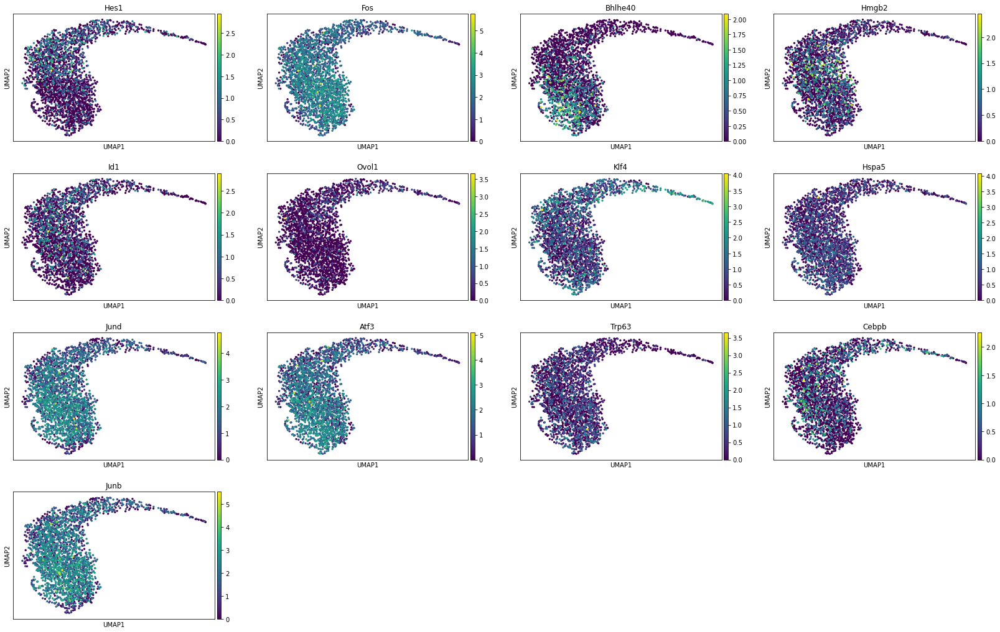

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


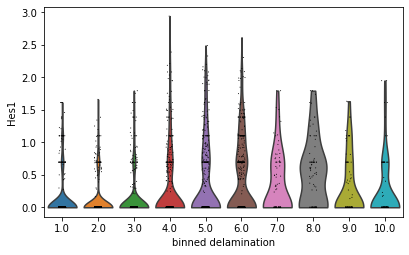

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


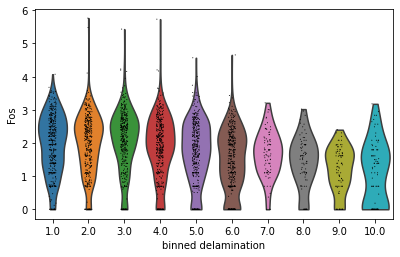

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


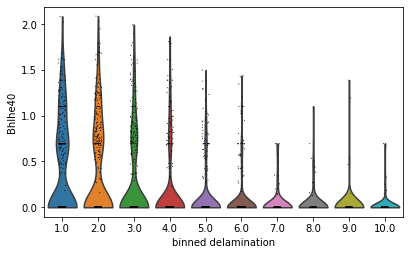

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


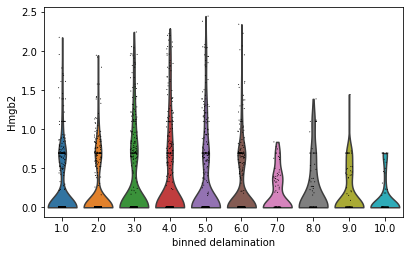

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


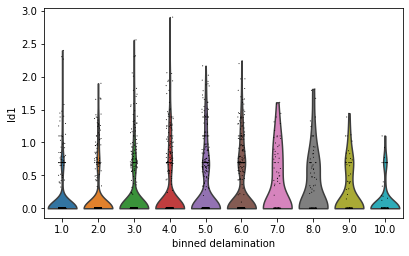

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


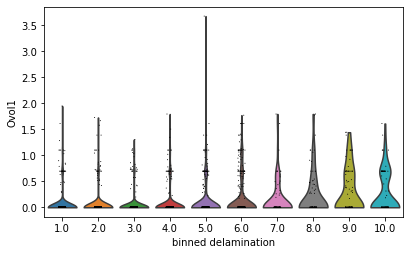

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


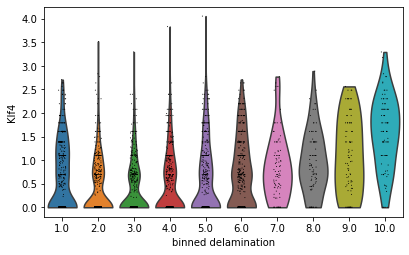

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


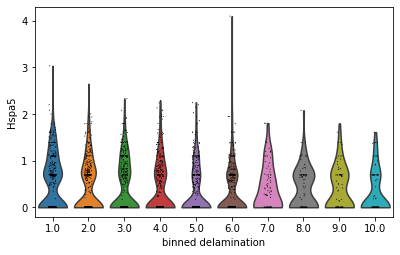

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


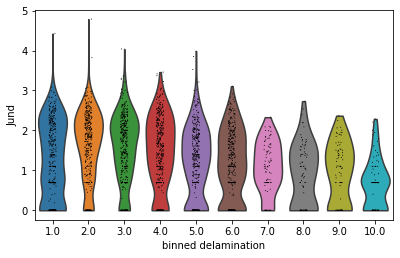

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


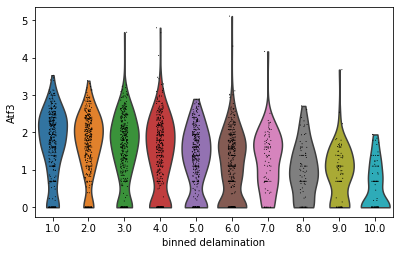

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


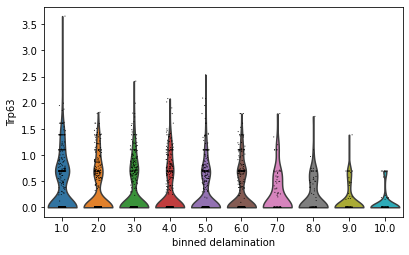

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


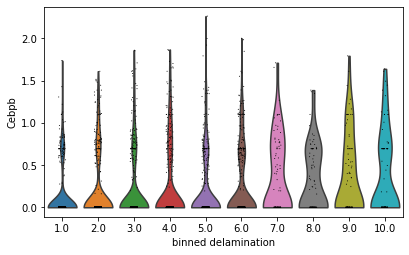

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


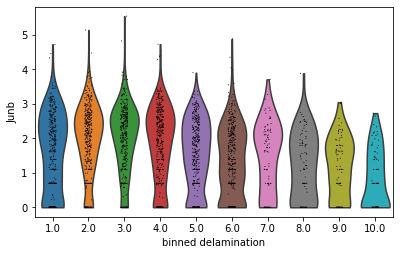

In [76]:
sc.pl.umap(data_magic, color = k10_tfs)
for g in k10_tfs:
    sc.pl.violin(data_magic, groupby='binned_delamination', keys = g)

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


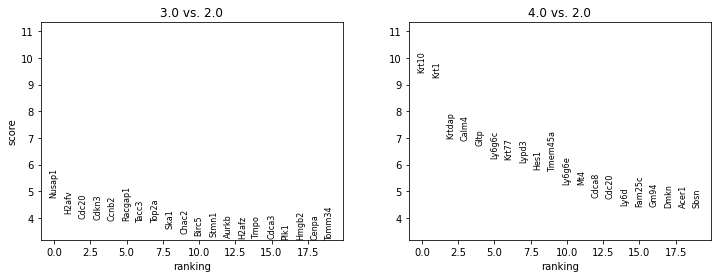

In [87]:
sc.tl.rank_genes_groups(data_magic, groupby = 'binned_delamination', groups = [3.0, 4.0], reference = 2.0)
sc.pl.rank_genes_groups(data_magic)

In [164]:
gs = pd.DataFrame(data_magic.uns['rank_genes_groups']['names']).head(20)

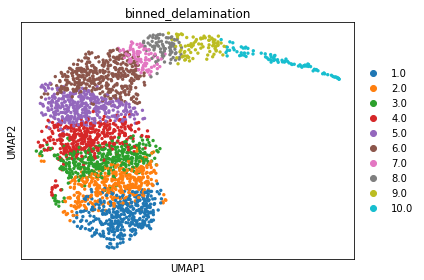

In [96]:
sc.pl.umap(data_magic, color = 'binned_delamination')

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


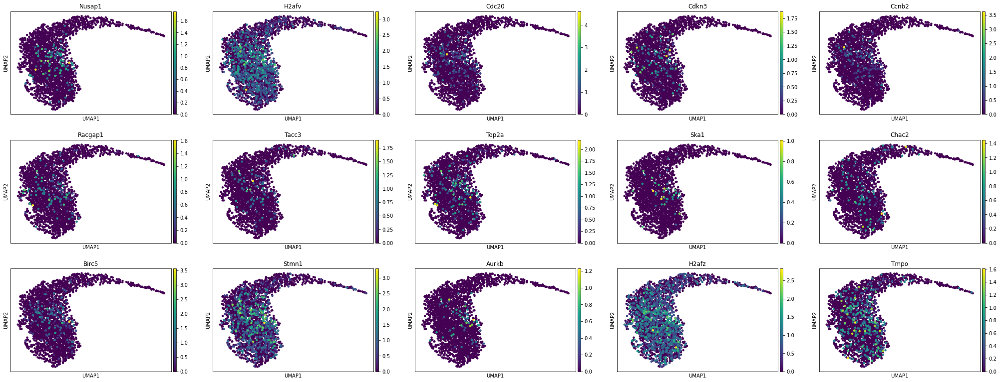

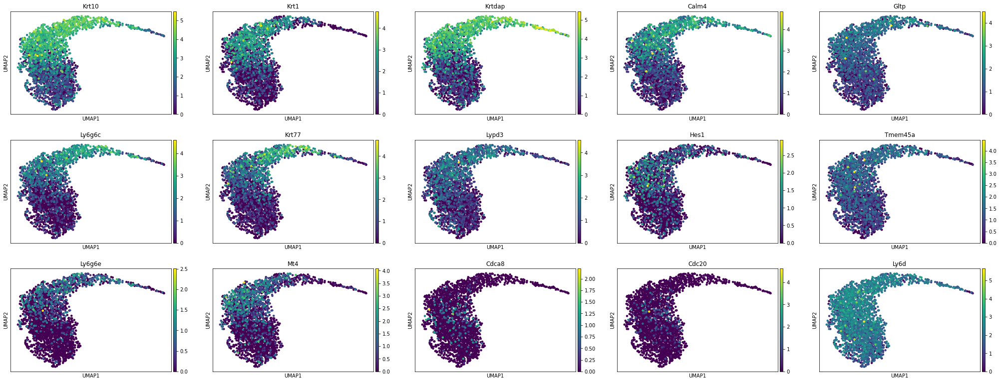

In [110]:
sc.pl.umap(data_magic, color = gs["3.0"], ncols = 5, s = 80)
sc.pl.umap(data_magic, color = gs["4.0"], ncols = 5, s = 80)

# Correlate bin 2,3,4 gene expression with K10

In [131]:
import anndata
anndata.AnnData(X = data_magic[data_magic.obs['binned_delamination'].isin([2,3,4])].raw.X)

AnnData object with n_obs × n_vars = 1153 × 20618

In [138]:
bin_data = data_magic[data_magic.obs['binned_delamination'].isin([2,3,4])].copy()
bin_data.raw = anndata.AnnData(X = data_magic[data_magic.obs['binned_delamination'].isin([2,3,4])].raw.X, var = data_magic.raw.var)

In [140]:
bin_mtx = pd.DataFrame(data = bin_data.raw.X, index = bin_data.obs_names, columns = bin_data.raw.var_names)
bin_mtx

,Xkr4,Rp1,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,...,Zfy2,Sry,Gm10352,Gm4064,Gm10256,Gm3376,Gm20815,Gm20816,Gm20867,Erdr1
obs_names,,,,,,,,,,,,,,,,,,,,,
1772067075-D05-ife-C1,0.0,0.62807,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.628070
1772072282-G12-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1772067078-F11-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1772067078-G05-ife-C1,0.0,0.00000,0.0,0.000000,0.0,1.098612,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.693147
1772067071-C10-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGACACTTCCGAA-9w-10x,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
TTGCTAACGCTAAC-9w-10x,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
TTTAGCTGGGTTAC-9w-10x,0.0,0.00000,0.0,0.828497,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


Krt10      1.000000
Krtdap     0.654343
Calm4      0.557465
Krt1       0.554441
Mt4        0.550372
Ly6g6c     0.548178
Krt77      0.523219
Gm94       0.508462
Sbsn       0.499428
Dmkn       0.446560
Lypd3      0.409358
Ly6g6e     0.406554
Elovl4     0.404355
Acer1      0.399821
Fam25c     0.393370
Hpgds      0.374681
Gltp       0.359306
Hes1       0.335047
Rab25      0.333921
Dsg1a      0.330864
Zfp750     0.325070
Dsp        0.323235
Ptgs1      0.322934
Dsc3       0.319400
Alox12e    0.319184
Them5      0.317085
Perp       0.316059
Fabp5      0.315989
Tmprss4    0.315473
Anxa8      0.314153
Krt78      0.305944
dtype: float64

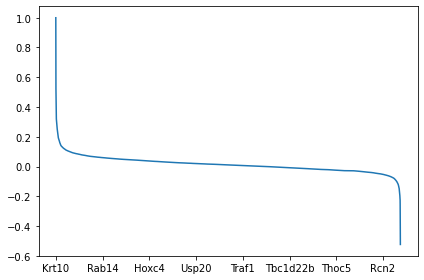

In [172]:
corr_mtx = bin_mtx.corrwith(bin_mtx['Krt10'])
corr_mtx.dropna().sort_values(ascending = False).plot()
corr_mtx[corr_mtx>0.3].sort_values(ascending = False)

In [194]:
tmp = adjacencies[adjacencies['TF'] == 'Hes1']
tmp = tmp[tmp['importance'] > 20]
tmp

,TF,target,importance
129,Hes1,Krt10,67.834521
179,Hes1,Calm4,57.341507
187,Hes1,Krt1,56.075554
212,Hes1,Krt14,52.476146
219,Hes1,Mt4,51.948655
253,Hes1,Krtdap,47.473254
291,Hes1,S100a6,44.390451
325,Hes1,Krt77,41.893223
355,Hes1,Cxcl14,40.406499
381,Hes1,Krt5,39.027841


In [198]:
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx>0.3].sort_values(ascending = False).index)]
tmp = tmp[tmp['importance'] > 10]
gs = set(tmp['TF'].values)

In [217]:
scores = []
for g in gs:
    adj_g = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]
    if len(adj_g) < 10:
        continue
    sc.tl.score_genes(data_magic, gene_list = adj_g['target'].values, score_name = f'{g}_score', use_raw = True)
    scores.append(f'{g}_score')
    clear_output()

In [266]:
adjacencies[(adjacencies['TF']=='Hmgb2') & (adjacencies['importance']>10)]['target'].values[:20]

array(['Ube2c', 'Cenpa', 'Ccnb1', 'Cdc20', 'Birc5', 'Ccnb2', 'Cdca8',
       'Stmn1', 'Cdca3', 'Cdk1', 'Spc24', 'Cdkn3', 'Top2a', 'H2afx',
       'Cenpf', 'Hmgn2', 'Nusap1', 'Pbk', 'Cks2', 'H2afv'], dtype=object)

In [276]:
root = '/mnt/g' if 'mnt' in os.getcwd() else 'G:'

fig_path = '{}/My Drive/MKA/Papers/Greco/Katie/20220322_NCB_resubmission/CDKN1B_Counting'.format(root)

In [285]:
scores_sel = ['Egr2_score', 'Csnk2b_score', 'Klf4_score', 'Cebpb_score', 'Trp63_score', 'Klf9_score','Klf2_score', 'Arg1_score','Ovol1_score', 'Id1_score','Gata3_score','Hes1_score','Bhlhe40_score','Hmgb2_score',]

['Rbm3_score',
 'Egr2_score',
 'Csnk2b_score',
 'Cers3_score',
 'Klf4_score',
 'Cebpb_score',
 'Hspa5_score',
 'Jund_score',
 'Rps4x_score',
 'Klf3_score',
 'Trp63_score',
 'Junb_score',
 'Klf9_score',
 'Klf2_score',
 'Fosl1_score',
 'Arg1_score',
 'Ovol1_score',
 'Smap2_score',
 'Id1_score',
 'Gata3_score',
 'Mxd1_score',
 'Fos_score',
 'Atf3_score',
 'Hes1_score',
 'Bhlhe40_score',
 'Hmgb2_score',
 'Ezr_score']

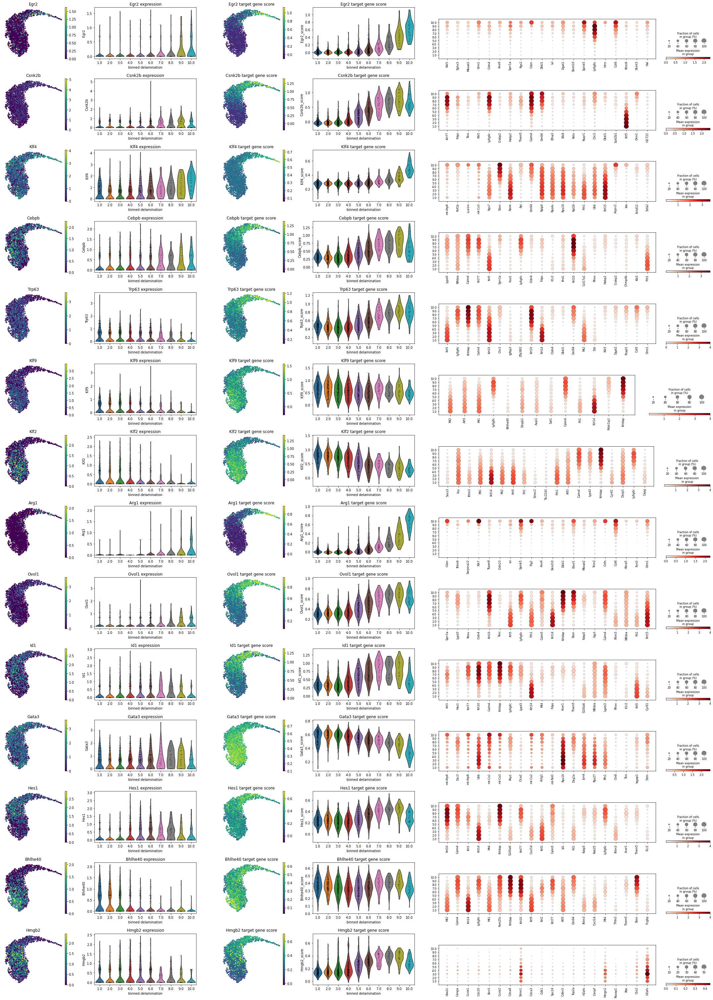

In [294]:
#sc.pl.umap(data_magic, color=scores)
scores_sel = ['Egr2_score', 'Csnk2b_score', 'Klf4_score', 'Cebpb_score', 'Trp63_score', 'Klf9_score','Klf2_score', 'Arg1_score','Ovol1_score', 'Id1_score','Gata3_score','Hes1_score','Bhlhe40_score','Hmgb2_score']
ncols = 5
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (30, 3*nrows), gridspec_kw = {'width_ratios': [1,1.5, 1,1.5,4]})
for ix, score in enumerate(scores_sel):
    g = score.split('_')[0]
    ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:20]
    
    sc.pl.umap(data_magic, color = g, show = False, ax = axes[ix, 0], frameon = False)
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [g], show = False, ax = axes[ix, 1])
    axes[ix, 1].set_title(f'{g} expression')
    sc.pl.umap(data_magic, color=score, show = False, ax = axes[ix, 2], frameon = False)
    axes[ix, 2].set_title(f'{g} target gene score')
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = axes[ix, 3])
    axes[ix, 3].set_title(f'{g} target gene score')
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    sc.pl.dotplot(data_magic, var_names = ts, groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = axes[ix, 4], show = False, categories_order = order)
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_SELECTED_Scores_Expression_plots.pdf'), bbox_inches = 'tight')

### Find motifs for the selected genes

In [251]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    #display(HTML(df.head().to_html(escape=False)))
    display(HTML(df.to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [51]:
#reg_csv = os.path.join(scenic_path_v2, 'reg.csv')
df_motifs = load_motifs(reg_csv)

In [238]:
gs

{'Arg1',
 'Atf3',
 'Bhlhe40',
 'Cebpb',
 'Cers3',
 'Csnk2b',
 'Egr2',
 'Ezr',
 'Fos',
 'Fosl1',
 'Gata3',
 'Hes1',
 'Hmgb2',
 'Hspa5',
 'Id1',
 'Junb',
 'Jund',
 'Kdm5b',
 'Klf2',
 'Klf3',
 'Klf4',
 'Klf9',
 'Mxd1',
 'Ovol1',
 'Rbm3',
 'Rps4x',
 'Scmh1',
 'Smap2',
 'Sp2',
 'Trp63'}

In [252]:
#selected_motifs = ['Bcl3', 'Hes1','Klf2','Klf3','Mxd1','Ovol', 'Pml', 'Sox6','Zfp110','Zfp341','Zfp64']
selected_motifs = ['Hes1','Ovol1','Cebpb','Hmgb2','Id1','Egr2','Csnk2b','Trp63','Arg1']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [253]:
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False),top_target_genes = 3)

In [247]:
adjacencies[adjacencies['TF']=='Grhl3']

,TF,target,importance


/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


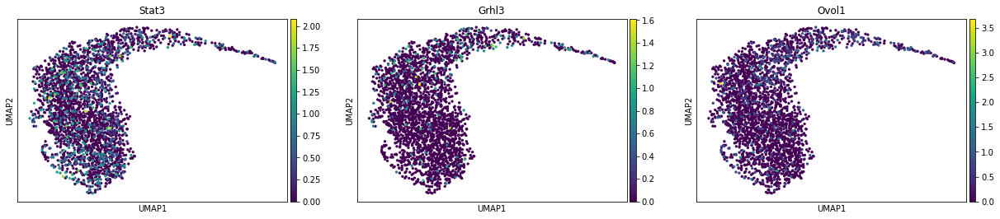

In [254]:
sc.pl.umap(data_magic, color = ['Stat3', 'Grhl3', 'Ovol1'])

In [250]:
selected_motifs = ['Stat3', 'Ovol1']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False),top_target_genes = 3)

In [235]:
df_motifs_sel.sort_values([('Enrichment','NES')])

Enrichment            \
                                                         AUC       NES   
TF    MotifID                                                            
Fos   cisbp__M0362                                  0.044376  3.000524   
      jaspar__MA0967.1                              0.084626  3.000664   
Klf4  hocomoco__KLF9_HUMAN.H11MO.0.C                0.043488  3.000774   
Fos   hocomoco__FOS_HUMAN.H11MO.0.A                 0.042458  3.000895   
Junb  swissregulon__hs__ATF5_CREB3.p2               0.037402  3.001464   
...                                                      ...       ...   
Fosl1 swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2   0.096138  5.809086   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2   0.072635  5.830834   
Fos   swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2   0.068742  5.928172   
      homer__GGCCCCGCCCCC_Sp1                       0.046308  5.945506   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2   0.188860  6.052172   

                                                                         \
                                                  MotifSimilarityQvalue   
TF    MotifID                                                             
Fos   cisbp__M0362                                             0.000148   
      jaspar__MA0967.1                                         0.000075   
Klf4  hocomoco__KLF9_HUMAN.H11MO.0.C                           0.000245   
Fos   hocomoco__FOS_HUMAN.H11MO.0.A                            0.000000   
Junb  swissregulon__hs__ATF5_CREB3.p2                          0.000947   
...                                                                 ...   
Fosl1 swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2              0.000000   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2              0.000701   
Fos   swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2              0.000000   
      homer__GGCCCCGCCCCC_Sp1                                  0.000001   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2              0.000701   

                                                                       \
                                                  OrthologousIdentity   
TF    MotifID                                                           
Fos   cisbp__M0362                                           0.936842   
      jaspar__MA0967.1                                       0.936842   
Klf4  hocomoco__KLF9_HUMAN.H11MO.0.C                         1.000000   
Fos   hocomoco__FOS_HUMAN.H11MO.0.A                          0.936842   
Junb  swissregulon__hs__ATF5_CREB3.p2                        0.264535   
...                                                               ...   
Fosl1 swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2            0.885609   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2            0.950276   
Fos   swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2            0.936842   
      homer__GGCCCCGCCCCC_Sp1                                0.936842   
Atf3  swissregulon__hs__FOS_FOS_B_L1__JUN_B_D_.p2            0.950276   

                                                                                                      \
                                                                                          Annotation   
TF    MotifID                                                                                          
Fos   cisbp__M0362                                 motif similar to taipale_cyt_meth__FOS_NRTGACG...   
      jaspar__MA0967.1                             gene is orthologous to ENSG00000170345 in H. s...   
Klf4  hocomoco__KLF9_HUMAN.H11MO.0.C               gene is annotated for similar motif hocomoco__...   
Fos   hocomoco__FOS_HUMAN.H11MO.0.A                gene is orthologous to ENSG00000170345 in H. s...   
Junb  swissregulon__hs__ATF5_CREB3.p2              gene is orthologous to FBgn0001291 in D. melan...   
...                                                                                              ...   
Fos

### Plot regulon score on umap

#### Use data_magic

In [73]:
cl_dict = {}
for cl in sorted(rss_cellType.index):
    genes = rss_cellType.loc[cl].sort_values(ascending = False)[:10].index
    genes = [x[0] for x in genes.str.split('_')]

    cl_dict[cl] = {g: sorted({inner[0] for val in df_motifs.loc[g, ('Enrichment', 'TargetGenes')].values for inner in val}) for g in genes}

In [74]:
for cl, genes_dict in cl_dict.items():
    for g, gs in genes_dict.items():
        if any([x in data_magic.var_names for x in gs]):
            sc.tl.score_genes(data_magic, gs, score_name = f'{g}_score ({cl})')
clear_output()

In [ ]:
#Cell output not shown due to size limitations
gs = [f'{g}_score ({cl})' for cl, genes_dict in cl_dict.items() for g in genes_dict]
gs = [x for x in gs if x in data_magic.obs]
sc.pl.umap(data_magic, color = gs, cmap = 'viridis', ncols = 5, vmin = 0, frameon = False)

#### use downsampled_data

In [63]:
downsampled_data.obsm = data_magic[downsampled_data.obs_names].obsm

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['distances'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['connectivities'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,


In [64]:
for cl, genes_dict in cl_dict.items():
    for g, gs in genes_dict.items():
        if any([x in downsampled_data.var_names for x in gs]):
            sc.tl.score_genes(downsampled_data, gs, score_name = f'{g}_score ({cl})')
clear_output()

In [ ]:
#Cell output not shown due to size limitations
gs = [f'{g}_score ({cl})' for cl, genes_dict in cl_dict.items() for g in genes_dict]
gs = [x for x in gs if x in downsampled_data.obs]
axes = sc.pl.umap(downsampled_data, color = gs, cmap = 'viridis', ncols = 5, vmin = 0, frameon = False, s = 50, show = False)
for ax in axes:
    ax.set_title(ax.get_title(), fontsize = 16)

## Get regulons

In [88]:
from cytoolz import compose
from pyscenic.transform import df2regulons

In [182]:
def derive_regulons(motifs, db_names=('mm9-tss-centered-10kb-10species', 
                                 'mm9-500bp-upstream-10species', 
                                 'mm9-tss-centered-5kb-10species')):
    motifs.columns = motifs.columns.droplevel(0)
    motifs['Context'] = motifs['Context'].apply(lambda x: eval(x))
    motifs['TargetGenes'] = motifs['TargetGenes'].apply(lambda x: eval(x))
    
    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [235]:
reg_df = pd.read_csv(reg_csv, index_col = [0,1], header = [0,1])
reg_df.head()

Enrichment            \
                                               AUC       NES   
TF    MotifID                                                  
Atf1  swissregulon__hs__CREB1.p2          0.113658  3.304464   
Atf6b transfac_pro__M01586                0.090813  3.001840   
      transfac_pro__M07312                0.090938  3.013453   
Bcl3  cisbp__M6137                        0.118944  3.085951   
      dbcorrdb__RELA__ENCSR000EAI_1__m1   0.122637  3.308505   

                                                               \
                                        MotifSimilarityQvalue   
TF    MotifID                                                   
Atf1  swissregulon__hs__CREB1.p2                     0.000478   
Atf6b transfac_pro__M01586                           0.000009   
      transfac_pro__M07312                           0.000248   
Bcl3  cisbp__M6137                                   0.000028   
      dbcorrdb__RELA__ENCSR000EAI_1__m1              0.000000   

                                                             \
                                        OrthologousIdentity   
TF    MotifID                                                 
Atf1  swissregulon__hs__CREB1.p2                   0.918216   
Atf6b transfac_pro__M01586                         0.864023   
      transfac_pro__M07312                         0.864023   
Bcl3  cisbp__M6137                                 0.819196   
      dbcorrdb__RELA__ENCSR000EAI_1__m1            0.808370   

                                                                                            \
                                                                                Annotation   
TF    MotifID                                                                                
Atf1  swissregulon__hs__CREB1.p2         gene is orthologous to ENSG00000123268 in H. s...   
Atf6b transfac_pro__M01586               gene is orthologous to ENSG00000213676 in H. s...   
      transfac_pro__M07312               gene is orthologous to ENSG00000213676 in H. s...   
Bcl3  cisbp__M6137                       gene is orthologous to ENSG00000069399 in H. s...   
      dbcorrdb__RELA__ENCSR000EAI_1__m1  motif similar to factorbook__NFKB1 ('NFKB1'; q...   

                                                                                            \
                                                                                   Context   
TF    MotifID                                                                                
Atf1  swissregulon__hs__CREB1.p2         frozenset({'mm9-500bp-upstream-7species.mc9nr'...   
Atf6b transfac_pro__M01586               frozenset({'mm9-500bp-upstream-7species.mc9nr'...   
      transfac_pro__M07312               frozenset({'mm9-500bp-upstream-7species.mc9nr'...   
Bcl3  cisbp__M6137                       frozenset({'mm9-500bp-upstream-7species.mc9nr'...   
      dbcorrdb__RELA__ENCSR000EAI_1__m1  frozenset({'mm9-500bp-upstream-7species.mc9nr'...   

                                                                                            \
                                                                               TargetGenes   
TF    MotifID                                                                                
Atf1  swissregulon__hs__CREB1.p2         [('Zfand5', 0.6575077565927325), ('Rnf44', 1.6...   
Atf6b transfac_pro__M01586               [('Ppp1r15a', 1.1747726971355468), ('Ube2h', 1...   
      transfac_pro__M07312               [('Ube2h', 1.4693784908421104), ('Btg2', 1.989...   
Bcl3  cisbp__M6137                       [('Nfkbia', 1.4548313825369616), ('Cxcl10', 0....   
      dbcorrdb__RELA__ENCSR000EAI_1__m1  [('Nfkbia', 1.4548313825369616), ('Cxcl10', 0....   

                                                   
                                        RankAtMax  
TF    MotifID                                      
Atf1  swissregulon__hs__CREB1.p2             1663  
Atf6b transfac_pro__M01586        

In [236]:
regulons = derive_regulons(reg_df.copy(), db_names = ['mm9-500bp-upstream-7species.mc9nr'])

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [241]:
for r in regulons:
    if 'Krt10' in r.genes:
        print(r.transcription_factor)

In [240]:
r.genes

('Nfkbiz',
 'Tmprss13',
 'Appl2',
 'Dnase1l3',
 'Adcy6',
 'Zfand6',
 'Dsg1a',
 'Kdm6b',
 'Acer1',
 '4931406P16Rik',
 'Pkp1',
 'Rnf44',
 'Atat1',
 'Golph3l',
 'Pof1b',
 'Cpa4',
 'Pvrl3',
 'Ovol1',
 'Pde4b',
 'Tgif1',
 'Gramd1c',
 'Slc25a24',
 'Elovl1',
 'Dhx8')

#### Find regulons that target Krt10

In [258]:
#sorted([x for x in set([g for tf, gs in tfs.items() for g in gs]) if 'Krt' in x])
krt = ['Krt1','Krt2', 'Krtdap', 'Krt5','Krt14','Krt15', 'Krt17']
krt_tfs = set([tf[0] for tf, gs in tfs.items() if any(x in krt for x in gs)])
krt_tfs

{'Ahr',
 'Atf3',
 'Bcl3',
 'Cebpb',
 'Creb5',
 'Dlx3',
 'Esrra',
 'Ezh2',
 'Fos',
 'Fosl1',
 'Gata3',
 'Hes1',
 'Id4',
 'Junb',
 'Jund',
 'Klf11',
 'Klf2',
 'Klf3',
 'Klf4',
 'Klf9',
 'Max',
 'Nfe2l2',
 'Nfic',
 'Nfkb1',
 'Nfyb',
 'Nfyc',
 'Nr1d1',
 'Relb',
 'Rps4x',
 'Smad4',
 'Smap2',
 'Sox9',
 'Trp63',
 'Zfp217',
 'Zfp523'}

#### Plot regulons with targeting some Keratins

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


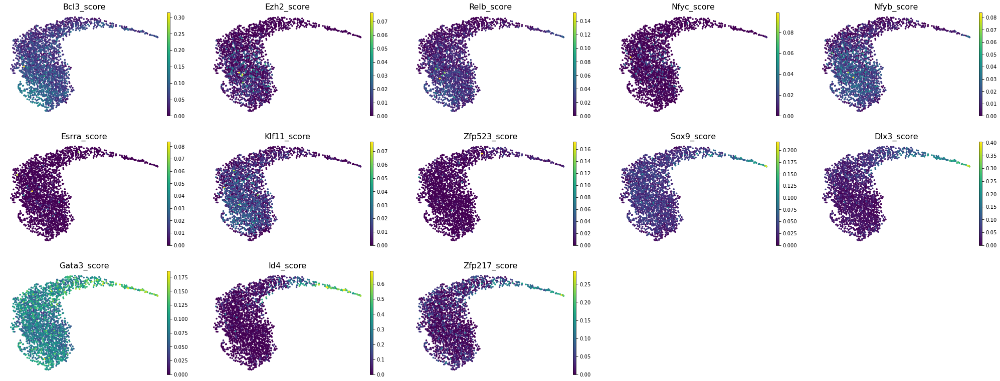

In [267]:
gs = []
tmp = []
for cl, genes_dict in cl_dict.items():
    for g in genes_dict:
        if all([g in krt_tfs, g not in tmp]):
            gs.append(f'{g}_score ({cl})')
            tmp.append(g)
#gs = [f'{g}_score ({cl})' for cl, genes_dict in cl_dict.items() for g in genes_dict if g in krt_tfs]
gs = [x for x in gs if x in downsampled_data.obs]
axes = sc.pl.umap(downsampled_data, color = gs, cmap = 'viridis', ncols = 5, vmin = 0, frameon = False, s = 50, show = False)
for ax in axes:
    ax.set_title(ax.get_title().split(' ')[0], fontsize = 16)

## Select the top 5 regulons from each cell typ

In [211]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

### Generate a Z-score for each regulon to enable comparison between regulons

In [212]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

### Generate a binary regulon activity matrix:

In [221]:
binary_mtx, auc_thresholds = binarize( auc_mtx, num_workers=25 )
binary_mtx.head()

,AI987944_(+),Atf3_(+),Bcl3_(+),Brf2_(+),Creb3l2_(+),Elf2_(+),Esrra_(+),Ets1_(+),Fos_(+),Fosl1_(+),...,Pole4_(+),Ppargc1a_(+),Setdb1_(+),Sin3a_(+),Sox6_(+),Spi1_(+),Tgif1_(+),Zfp110_(+),Zfp341_(+),Zfp64_(+)
1772067075-D05-ife-C1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,1,0
1772067086-E12-ife-C1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1772072282-G12-ife-C1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
1772067078-F11-ife-C1,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
1772067078-G05-ife-C1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0


### Show the AUC distributions for selected regulons

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-leve

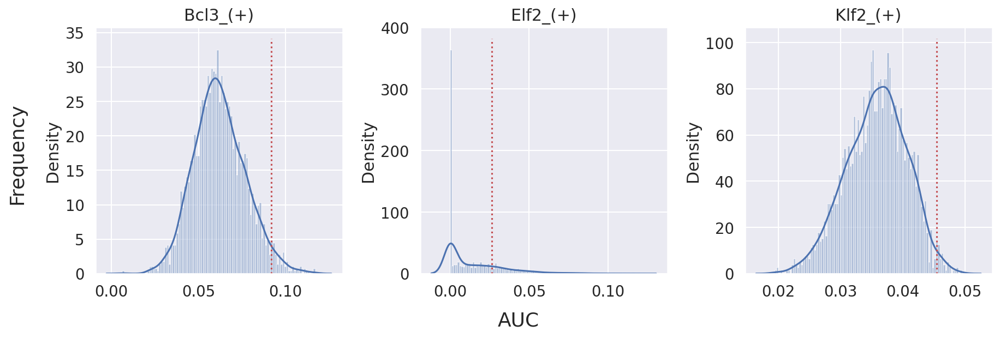

In [222]:
# select regulons:
r = [ 'Bcl3_(+)', 'Elf2_(+)', 'Klf2_(+)', 'Klf3_(+)' ]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')
    
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='large')
fig.text(0.5, -0.01, 'AUC', ha='center', va='center', rotation='horizontal', size='large')

fig.tight_layout()
#fig.savefig('PBMC10k_cellType-binaryPlot2.pdf', dpi=600, bbox_inches='tight')

## Regulon specificity scores (RSS) across Leiden clusters

### Calculate RSS

In [223]:
rss_leiden = regulon_specificity_scores( auc_mtx, cellAnnot['Leiden_clusters_Scanpy'] )
rss_leiden

,AI987944_(+),Atf3_(+),Bcl3_(+),Brf2_(+),Creb3l2_(+),Elf2_(+),Esrra_(+),Ets1_(+),Fos_(+),Fosl1_(+),...,Pole4_(+),Ppargc1a_(+),Setdb1_(+),Sin3a_(+),Sox6_(+),Spi1_(+),Tgif1_(+),Zfp110_(+),Zfp341_(+),Zfp64_(+)
1,0.309694,0.351699,0.355203,0.353930,0.386797,0.312107,0.372494,0.242251,0.357848,0.351680,...,0.360630,0.401883,0.238310,0.376579,0.324418,0.351405,0.332758,0.328644,0.419657,0.191743
2,0.310852,0.390807,0.391813,0.368244,0.289644,0.313185,0.377826,0.392414,0.381611,0.392167,...,0.377840,0.323573,0.280536,0.359204,0.379631,0.322285,0.402604,0.303384,0.229590,0.201567
0,0.361999,0.458544,0.451254,0.443567,0.377275,0.356241,0.455208,0.379220,0.452988,0.454165,...,0.472729,0.386173,0.278898,0.402652,0.476353,0.436261,0.402657,0.351238,0.297144,0.211322
3,0.243530,0.301604,0.305239,0.277275,0.346285,0.275113,0.305406,0.182176,0.310817,0.302808,...,0.290639,0.362093,0.210970,0.348479,0.264870,0.307627,0.297383,0.285645,0.429053,0.196750
4,0.174127,0.192151,0.197609,0.186074,0.210716,0.208950,0.187321,0.169817,0.204374,0.200880,...,0.185302,0.202261,0.172180,0.206234,0.173564,0.184216,0.182420,0.187283,0.209968,0.169213


## RSS panel plot with all cell types

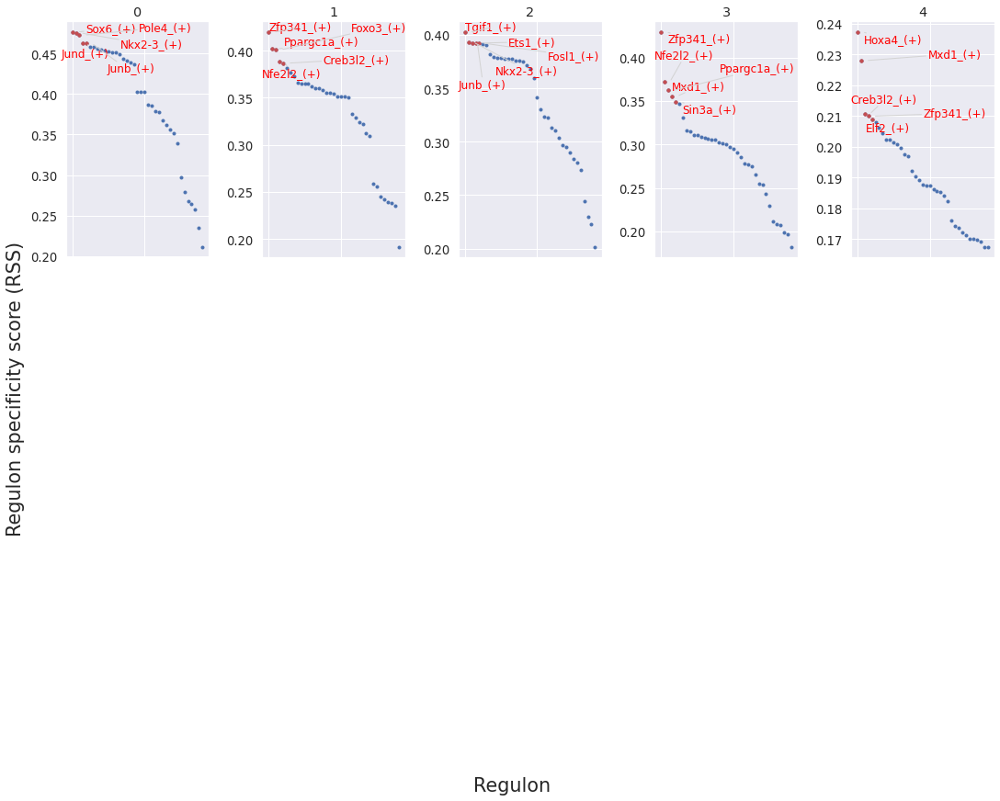

In [224]:
cats = sorted( list(set(cellAnnot['Leiden_clusters_Scanpy'])), key=int )

fig = plt.figure(figsize=(15, 12))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_leiden.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_leiden, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )

fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_Louvain-RSS-top5.png", dpi=150, bbox_inches = "tight")
plt.show()

# Further exploration of modules directly from the network inference output

In [226]:
adjacencies = pd.read_csv(os.path.join(scenic_path, "adj.csv"), index_col=False, sep=',')

In [227]:
from pyscenic.utils import modules_from_adjacencies
modules = list(modules_from_adjacencies(adjacencies, exprMat))


2022-04-29 10:04:08,967 - pyscenic.utils - INFO - Calculating Pearson correlations.

2022-04-29 10:04:08,978 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [False].

2022-04-29 10:04:09,703 - pyscenic.utils - INFO - Creating modules.


In [228]:
tf = 'Klf2'
tf_mods = [ x for x in modules if x.transcription_factor==tf ]

for i,mod in enumerate( tf_mods ):
    print( f'{tf} module {str(i)}: {len(mod.genes)} genes' )
print( f'{tf} regulon: {len(regulons[tf+"_(+)"])} genes' )

Klf2 module 0: 226 genes
Klf2 module 1: 131 genes
Klf2 module 2: 51 genes
Klf2 module 3: 125 genes
Klf2 module 4: 227 genes
Klf2 module 5: 328 genes
Klf2 regulon: 611 genes


write these modules, and the regulon to files:

In [229]:
for i,mod in enumerate( tf_mods ):
    with open( os.path.join(scenic_path, tf+'_module_'+str(i)+'.txt'), 'w') as f:
        for item in mod.genes:
            f.write("%s\n" % item)
            
with open( os.path.join(scenic_path, tf+'_regulon.txt'), 'w') as f:
    for item in regulons[tf+'_(+)']:
        f.write("%s\n" % item)

# Make plots

## Load modules

In [22]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

from cytoolz import compose
from pyscenic.transform import df2regulons

import anndata

In [18]:
def derive_regulons(motifs, db_names=('mm9-tss-centered-10kb-10species', 
                                 'mm9-500bp-upstream-10species', 
                                 'mm9-tss-centered-5kb-10species')):
    motifs.columns = motifs.columns.droplevel(0)
    motifs['Context'] = motifs['Context'].apply(lambda x: eval(x))
    motifs['TargetGenes'] = motifs['TargetGenes'].apply(lambda x: eval(x))
    
    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [19]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL, head = 5):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    #display(HTML(df.head().to_html(escape=False)))
    display(HTML(df.head(head).to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

## Paths

In [10]:

# set variables for file paths to read from and write to:

scenic_path = '/mnt/g/My Drive/Python/Projects/Scenic'
scenic_path_v2 = '/mnt/g/My Drive/Python/Projects/Scenic/binned_delamination_10kb'

scenic_path_ = scenic_path.replace(' ', '\ ')
scenic_path_v2_ = scenic_path_v2.replace(' ', '\ ')

os.chdir(scenic_path_v2)

# path to unfiltered loom file (this will be created in the optional steps below)
f_loom_path_scenic = os.path.join(scenic_path_v2, f"{filename}_unfiltered_scenic.loom")

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = os.path.join(scenic_path_v2, f"{filename}_scenic.loom")
f_loom_path_scenic_ = os.path.join(scenic_path_v2_, f"{filename}_scenic.loom")

# path to pyscenic output
f_pyscenic_output = os.path.join(scenic_path_v2, "pyscenic_output.loom")
f_pyscenic_output_ = os.path.join(scenic_path_v2_, "pyscenic_output.loom")

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = os.path.join(scenic_path_v2, f'{filename}-output.loom')
f_final_loom_ = os.path.join(scenic_path_v2_, f'{filename}-output.loom')

#TF files
f_tfs = os.path.join(scenic_path, 'mm_mgi_tfs.txt')
f_tfs_ = os.path.join(scenic_path_, 'mm_mgi_tfs.txt')

adj_csv = os.path.join(scenic_path_v2, 'adj.csv')
adj_csv_ = os.path.join(scenic_path_v2_, 'adj.csv')

reg_csv = os.path.join(scenic_path_v2, 'reg.csv')
reg_csv_ = os.path.join(scenic_path_v2_, 'reg.csv')

## Plots

In [14]:
adjacencies = pd.read_csv(adj_csv)
reg_df = pd.read_csv(reg_csv, header = [0,1], index_col = [0,1])

In [16]:
adjacencies

,TF,target,importance
0,Hmgb2,Ube2c,2.250734e+02
1,Hmgb2,Cenpa,2.006313e+02
2,Hmgb2,Ccnb1,1.972609e+02
3,Hmgb2,Cdc20,1.945421e+02
4,Hmgb2,Birc5,1.941245e+02
...,...,...,...
327119,Snai2,Igfn1,5.123169e-21
327120,Hoxb2,Ceacam1,4.548607e-21
327121,Ahr,Trim66,3.508739e-21
327122,Zfp639,Atxn7l2,1.922812e-21


### Gene correlations

In [23]:
bin_data = data_magic[data_magic.obs['binned_delamination'].isin([2,3,4])].copy()
bin_data.raw = anndata.AnnData(X = data_magic[data_magic.obs['binned_delamination'].isin([2,3,4])].raw.X, var = data_magic.raw.var)

/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['distances'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:216: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['connectivities'] that happens to be dimensioned at n_obs×n_obs (2646×2646).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/home/karlan/miniconda3/envs/scenic/lib/python3.6/site-packages/anndata/compat/__init__.py:183: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning

In [24]:
bin_mtx = pd.DataFrame(data = bin_data.raw.X, index = bin_data.obs_names, columns = bin_data.raw.var_names)
bin_mtx

,Xkr4,Rp1,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,...,Zfy2,Sry,Gm10352,Gm4064,Gm10256,Gm3376,Gm20815,Gm20816,Gm20867,Erdr1
obs_names,,,,,,,,,,,,,,,,,,,,,
1772067075-D05-ife-C1,0.0,0.62807,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.628070
1772072282-G12-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1772067078-F11-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1772067078-G05-ife-C1,0.0,0.00000,0.0,0.000000,0.0,1.098612,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.693147
1772067071-C10-ife-C1,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGACACTTCCGAA-9w-10x,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
TTGCTAACGCTAAC-9w-10x,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
TTTAGCTGGGTTAC-9w-10x,0.0,0.00000,0.0,0.828497,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


Krt10      1.000000
Krtdap     0.654343
Calm4      0.557465
Krt1       0.554441
Mt4        0.550372
Ly6g6c     0.548178
Krt77      0.523219
Gm94       0.508462
Sbsn       0.499428
Dmkn       0.446560
Lypd3      0.409358
Ly6g6e     0.406554
Elovl4     0.404355
Acer1      0.399821
Fam25c     0.393370
Hpgds      0.374681
Gltp       0.359306
Hes1       0.335047
Rab25      0.333921
Dsg1a      0.330864
Zfp750     0.325070
Dsp        0.323235
Ptgs1      0.322934
Dsc3       0.319400
Alox12e    0.319184
Them5      0.317085
Perp       0.316059
Fabp5      0.315989
Tmprss4    0.315473
Anxa8      0.314153
Krt78      0.305944
dtype: float64

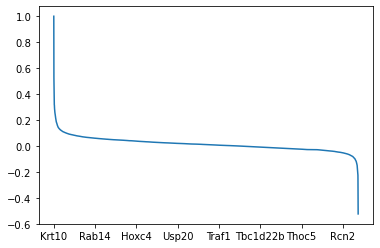

In [25]:
corr_mtx = bin_mtx.corrwith(bin_mtx['Krt10'])
corr_mtx.dropna().sort_values(ascending = False).plot()
corr_mtx[corr_mtx>0.3].sort_values(ascending = False)

#### Krt10 correlation

In [52]:
from adjustText import adjust_text

In [ ]:
corr_mtx = bin_mtx.corrwith(bin_mtx['Krt10'])
corr_mtx = pd.DataFrame(corr_mtx.dropna().sort_values(ascending = False)).reset_index().reset_index()
corr_mtx.columns = ['ix','gene','corr']
corr_mtx

In [75]:
fig_path

'/mnt/g/My Drive/MKA/Papers/Greco/Katie/Figure_output'

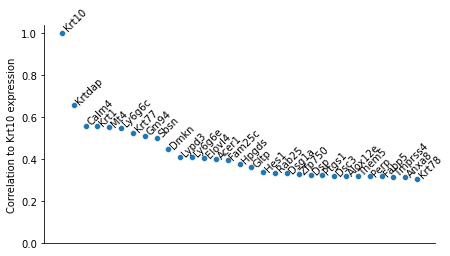

In [76]:
fig, ax = plt.subplots(figsize = (7, 4))
#tmp = corr_mtx[:2000].copy()
#sbn.scatterplot(data = tmp, x = 'ix', y = 'corr', ax = ax)

tmp = corr_mtx[corr_mtx['corr']>0.3]
sbn.scatterplot(data = tmp, x = 'ix', y = 'corr', ax = ax)
text = [ax.text(x = x, y = y+0.01*y, s = s, rotation = 45, fontsize = 10) for x, s, y in tmp.values]
ax.set_ylim(bottom = 0)
#ax.set_xlim([-1, 100])

[ax.spines[spine].set_visible(False) for spine in ['top','right']]

ax.set_ylabel('Correlation to Krt10 expression')
ax.set_xlabel('')
ax.set_xticks([])
fig.savefig(os.path.join(fig_path, 'Correlation_Krt10_downsampled_data.pdf'), bbox_inches = 'tight')

## TF targets

### Find TFs that are correlated with differentiation genes

In [86]:
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx['corr']>0.3]['gene'])]
tmp = tmp[tmp['importance'] > 10]
tfs = set(tmp['TF'].values)

In [87]:
#Score cells based on TF target genes
scores = []
for g in tfs:
    adj_g = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]
    if len(adj_g) < 10:
        continue
    sc.tl.score_genes(data_magic, gene_list = adj_g['target'].values, score_name = f'{g}_score', use_raw = True)
    scores.append(f'{g}_score')
    clear_output()
    
scores = sorted(scores)

In [96]:
tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1']

for tf in tfs:
    tmp = adjacencies[(adjacencies['TF']==tf) & (adjacencies['importance']>10)].copy()
    if len(tmp)<5:
        continue
    gs = tmp['target'].values
    sc.tl.score_genes(data_magic, gene_list=gs, score_name=f'{tf}_score', use_raw=True)

In [105]:
n_colors = 11

norm=plt.Normalize(0,n_colors)
cmap = mpl.colors.LinearSegmentedColormap.from_list("", [mpl.colors.to_rgb(x) for x in colors])
m = mpl.cm.ScalarMappable(cmap=cmap, norm = norm)
#c = [mpl.colors.to_hex(m.to_rgba(x)) for x in np.append(np.arange(0,6),np.append(np.arange(n_colors-6,n_colors-4), np.arange(n_colors-2,n_colors)))]
c = [mpl.colors.to_hex(m.to_rgba(x)) for x in np.arange(0,10)]


['#00ff00',
 '#5cf400',
 '#b8e900',
 '#ffda00',
 '#ffbf00',
 '#ffa600',
 '#ff8700',
 '#ff6200',
 '#ff3b00',
 '#f12500']

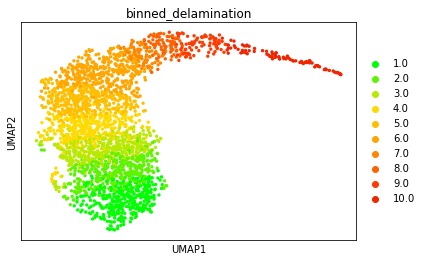

In [106]:
sc.pl.umap(data_magic, color = 'binned_delamination', palette = c)

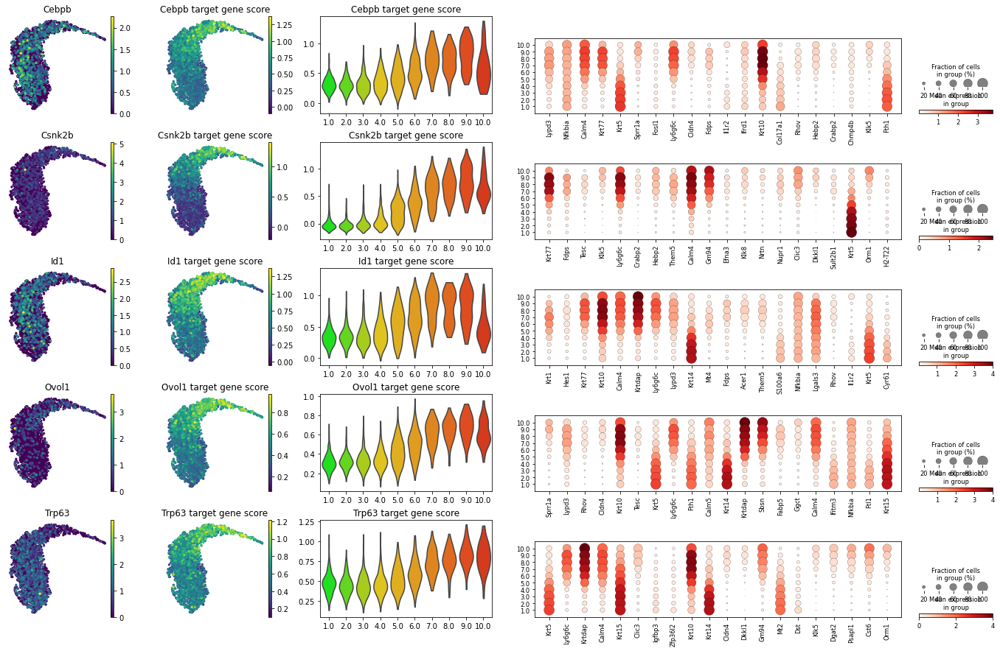

In [160]:
#scores_sel = scores
scores_sel = sorted([g for g in tfs if f'{g}_score' in data_magic.obs])
ncols = 4
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (6*ncols, 3*nrows), gridspec_kw = {'width_ratios': [1,1, 1.5, 4], 'hspace': 0.3, 'wspace': 0.2})
for ix, g in enumerate(scores_sel):
    score = f'{g}_score'
    ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:20]
    
    ax = axes[ix, 0]
    sc.pl.umap(data_magic, color = g, show = False, ax = ax, frameon = False)
    
    ax = axes[ix, 1]
    im = sc.pl.umap(data_magic, color=score, show = False, ax = ax, frameon = False)
    ax.set_title(f'{g} target gene score')
        
    ax = axes[ix, 2]
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = ax, palete = c, stripplot = False)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    ax.set_title(f'{g} target gene score')
    ax.set_ylabel('')
    ax.set_xlabel('')
    
    ax = axes[ix, 3]
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    sc.pl.dotplot(data_magic, var_names = ts, groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = ax, show = False, categories_order = order)
    ax.set_ylim(top = 13)
    
    axes[ix, 1].set_xlabel('')
    axes[ix, 3].set_xlabel('')
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_Scores_Selected_All-cells_Expression_plots.pdf'), bbox_inches = 'tight')

## Regulons

In [162]:
regulons = derive_regulons(reg_df.copy(), db_names = ['mm10__refseq-r80__10kb_up_and_down_tss.mc9nr'])

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [164]:
df_motifs = load_motifs(reg_csv)

In [165]:
tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1']
df_motifs_sel = df_motifs.loc[df_motifs.index[df_motifs.reset_index()['TF'].isin(tfs)]]
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False),top_target_genes = 3, head = 10)

In [168]:
tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1']
targets = {}
for tf in tfs:
    for r in regulons:
        if r.transcription_factor == tf:
            if tf not in targets:
                targets[tf] = r.gene2weight.keys()
            else:
                targets[tf].append(r.gene2weight.keys())
    if tf in targets:
        targets[tf] = set(targets[tf])

In [183]:
'Krt10' in targets.values()

False

In [170]:
tfs = targets.keys()

for tf in tfs:
    gs = targets[tf]
    sc.tl.score_genes(data_magic, gene_list=gs, score_name=f'{tf}_score', use_raw=True)

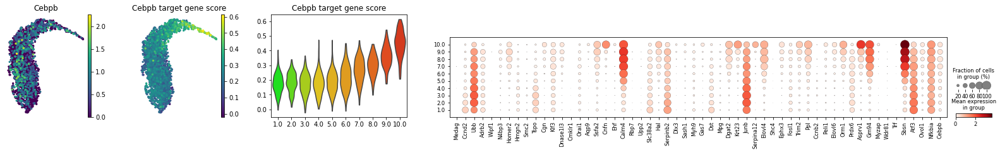

In [193]:
#scores_sel = scores
scores_sel = sorted([g for g in tfs if f'{g}_score' in data_magic.obs])
ncols = 4
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (7*ncols, 3*nrows), gridspec_kw = {'width_ratios': [1,1, 1.5, 6], 'hspace': 0.3, 'wspace': 0.2})
for ix, g in enumerate(scores_sel):
    score = f'{g}_score'
    #ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:20]
    ts = targets[g]
    
    #ax = axes[ix, 0]
    ax = axes[0]
    sc.pl.umap(data_magic, color = g, show = False, ax = ax, frameon = False)
    
    #ax = axes[ix, 1]
    ax = axes[1]
    im = sc.pl.umap(data_magic, color=score, show = False, ax = ax, frameon = False)
    ax.set_title(f'{g} target gene score')
        
    #ax = axes[ix, 2]
    ax = axes[2]
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = ax, palete = c, stripplot = False)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    ax.set_title(f'{g} target gene score')
    ax.set_ylabel('')
    ax.set_xlabel('')
    
    #ax = axes[ix, 3]
    ax = axes[3]
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    sc.pl.dotplot(data_magic, var_names = list(ts), groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = ax, show = False, categories_order = order)
    ax.set_ylim(top = 13)
    
    axes[1].set_xlabel('')
    axes[3].set_xlabel('')
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_Scores_Motif_analysis_All-cells_Expression_plots.pdf'), bbox_inches = 'tight')

In [213]:
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx['corr']>0.3]['gene'])]
tmp = tmp[tmp['importance'] > 10]
tfs = set(tmp['TF'].values)

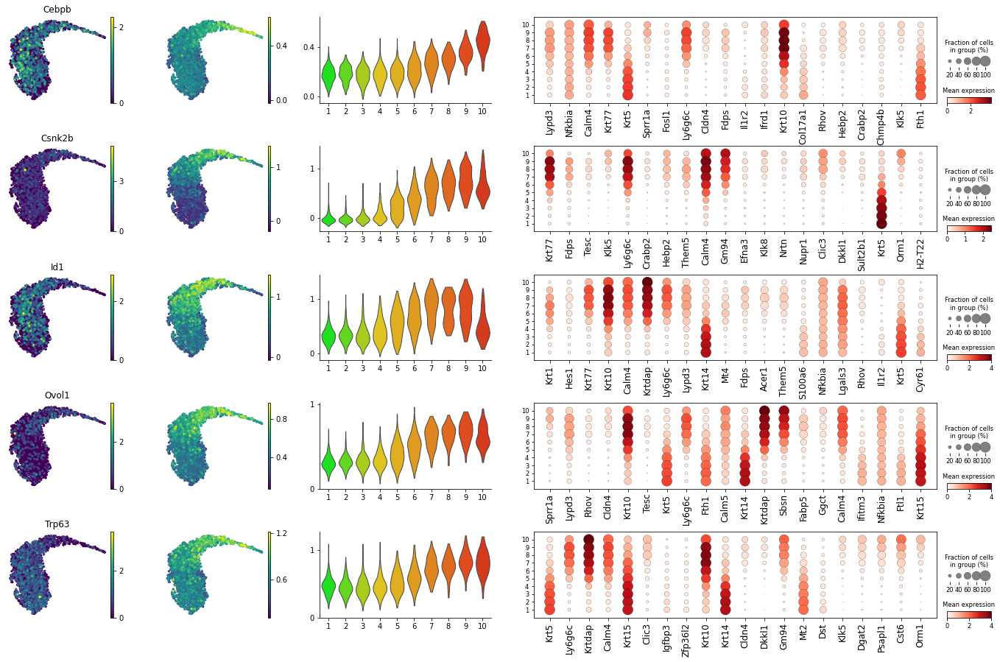

In [334]:
tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1']

data_magic.obs['binned_delamination'] = data_magic.obs['binned_delamination'].apply(lambda x: int(float(x)))
#scores_sel = scores
scores_sel = sorted(set([g for g in tfs if f'{g}_score' in data_magic.obs]))
ncols = 4
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (6*ncols, 3*nrows), gridspec_kw = {'width_ratios': [1,1, 1.5, 4], 'hspace': 0.5, 'wspace': 0.2})
for ix, g in enumerate(scores_sel):
    score = f'{g}_score'
    ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:20]
    
    ax = axes[ix, 0]
    sc.pl.umap(data_magic, color = g, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title(g)
    
    ax = axes[ix, 1]
    sc.pl.umap(data_magic, color=score, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_title('')
        
    ax = axes[ix, 2]
    #ax.axhline(0, ls = ':', c = 'lightgray', zorder = -1)
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = ax, palete = c, stripplot = False, linewidth = 1)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    ylim = ax.get_ylim()
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0)
    ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    #ax.set_title(f'{g} target gene score')
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_xticklabels([int(float(x.get_text())) for x in ax.get_xticklabels()])
    ax.set_ylabel('')
    ax.set_xlabel('')
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    
    ax = axes[ix, 3]
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    im = sc.pl.dotplot(data_magic, var_names = ts, groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = ax, show = False, categories_order = order, colorbar_title = 'Mean expression', figsize = (15, 5))
    im['mainplot_ax'].set_xticklabels(im['mainplot_ax'].get_xticklabels(), rotation = 90, horizontalalignment = 'center', fontsize = 12)
    im['color_legend_ax'].set_xlim(left = 0)
    im['color_legend_ax'].xaxis.set_major_locator(MaxNLocator(3, integer=True))
    #ax.set_title('Target gene expression' if ix == 0 else '')
    
    axes[ix, 1].set_xlabel('')
    axes[ix, 3].set_xlabel('')
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_Scores_Selected_All-cells_Expression_plots_v2.pdf'), bbox_inches = 'tight')

## Figure S7A

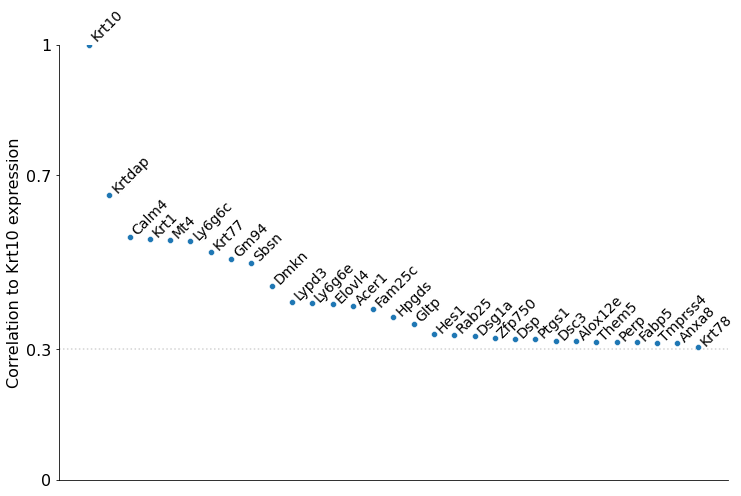

In [484]:
fig, ax = plt.subplots(figsize = (12, 8))
#tmp = corr_mtx[:2000].copy()
#sbn.scatterplot(data = tmp, x = 'ix', y = 'corr', ax = ax)

tmp = corr_mtx[corr_mtx['corr']>0.3]
sbn.scatterplot(data = tmp, x = 'ix', y = 'corr', ax = ax)
text = [ax.text(x = x, y = y+0.01*y, s = s, rotation = 45, fontsize = 14) for x, s, y in tmp.values]
ax.set_ylim(bottom = 0, top = 1)
ax.set_yticks([0, 0.3, 0.7, 1])
ax.set_yticklabels(map(str, [0, 0.3, 0.7, 1]), fontsize = 16)

[ax.spines[spine].set_visible(False) for spine in ['top','right']]

ax.set_ylabel('Correlation to Krt10 expression', fontsize = 16)
ax.set_xlabel('')
ax.set_xticks([])
ax.axhline(0.3, ls = ':', c = 'lightgray', zorder = -1)
fig.savefig(os.path.join(fig_path, 'Correlation_Krt10_downsampled_data_v2.pdf'), bbox_inches = 'tight')

In [411]:
top_targets = 30
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx['corr']>0.3]['gene'])]
tmp = tmp[tmp['importance'] > 10]
tfs = set(tmp['TF'].values)

tfs_dict = {}
for g in tfs:
    adj_g = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:top_targets]
    if len(adj_g) < 10:
        continue
    tfs_dict[g] = adj_g
    
#tfs_dict = {tf: ', '.join([t for t in targets if t!= None]) for tf, targets in tfs_dict.items()}
tfs_dict = {tf: ', '.join([t for t in targets if t!= None]) for tf, targets in tfs_dict.items()}

df = pd.DataFrame.from_dict(tfs_dict, orient = 'index')
df.columns = [f'Top {top_targets} target genes']
df.index.name = 'Name'

In [413]:
df.to_csv(os.path.join(fig_path, 'Differentiation_associated_TFs_Targets_list.csv'))

In [420]:
adjacencies[adjacencies['TF'] == 'Gata3']

,TF,target,importance
210,Gata3,mt-Atp6,5.262422e+01
255,Gata3,Dsc3,4.717335e+01
300,Gata3,mt-Atp8,4.354783e+01
322,Gata3,Ubb,4.199198e+01
329,Gata3,mt-Co1,4.179911e+01
...,...,...,...
326755,Gata3,Tgfa,2.032933e-19
326775,Gata3,Emcn,1.851514e-19
326843,Gata3,Dennd1c,1.396123e-19
326889,Gata3,Dpy19l3,1.157762e-19


In [416]:
#top_targets = 30
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx['corr']>0.3]['gene'])]
tmp = tmp[tmp['importance'] > 10]
tfs = set(tmp['TF'].values)

tfs_dict = {}
for g in tfs:
    adj_g = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values
    if len(adj_g) < 10:
        continue
    tfs_dict[g] = adj_g
    
tfs_dict = {tf: ', '.join([t for t in targets if t!= None]) for tf, targets in tfs_dict.items()}

df = pd.DataFrame.from_dict(tfs_dict, orient = 'index')
df.columns = [f'Top target genes']
df.index.name = 'Name'

In [417]:
df.applymap(lambda x: len(x.split(', ')))

,Top target genes
Name,
Gata3,105
Bhlhe40,73
Hspa5,13
Cers3,106
Rps4x,319
Rbm3,69
Ezr,22
Klf3,16
Klf2,19


# Recalculate scores based on differentiation genes

## Find differentially expressed genes in bin1

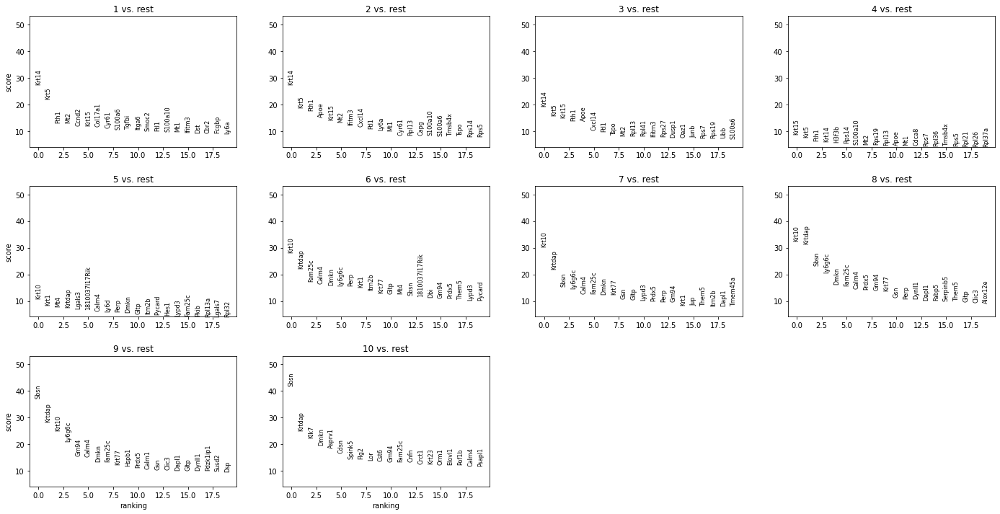

In [422]:
sc.tl.rank_genes_groups(data_magic, groupby = 'binned_delamination')
sc.pl.rank_genes_groups(data_magic)

In [434]:
deg = sc.get.rank_genes_groups_df(data_magic, group = '1')
#deg['logfoldchanges']
deg['pvals_adj'] = deg['pvals_adj'].apply(lambda x: -np.log10(x))
deg

,names,scores,logfoldchanges,pvals,pvals_adj
0,Krt14,27.471685,2.001956,2.836156e-128,123.233023
1,Krt5,22.240631,1.365932,7.502458e-88,83.713640
2,Fth1,13.285006,0.890896,5.256941e-36,32.345232
3,Mt2,13.120296,1.216831,2.304859e-34,30.754473
4,Ccnd2,12.228546,1.751479,5.996878e-30,26.412978
...,...,...,...,...,...
20613,Ly6g6c,-22.744246,-2.783757,2.597159e-97,93.049406
20614,Krtdap,-23.563208,-2.841539,1.414249e-99,95.234197
20615,Krt77,-23.992893,-2.917320,1.304287e-110,105.871410
20616,Calm4,-24.536116,-2.509852,3.757404e-108,103.712926


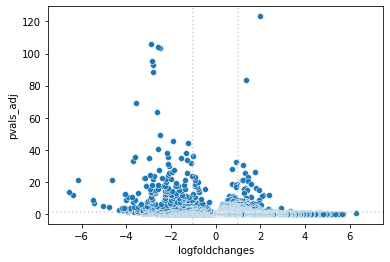

In [438]:
ax = sbn.scatterplot(data = deg, x = 'logfoldchanges', y = 'pvals_adj')
ax.set_xlim([-7.5, 7.5])
ax.axhline(-np.log10(0.05), ls = ':', c = 'lightgray')
[ax.axvline(x, ls = ':', c = 'lightgray') for x in [-1, 1]]

In [445]:
basal_genes = deg[(deg['pvals_adj']>-np.log10(0.05)) & (deg['logfoldchanges']>0.5)]['names'].values

## Remove basal genes from the score calculations

In [446]:
tmp = adjacencies[adjacencies['target'].isin(corr_mtx[corr_mtx['corr']>0.3]['gene'])]
tmp = tmp[tmp['importance'] > 10]
tfs = set(tmp['TF'].values)

#Score cells based on TF target genes
#Remove Bin1 DEGs from the list
scores = []
for g in tfs:
    adj_g = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values
    adj_g = [x for x in adj_g if x not in basal_genes]
    if len(adj_g) < 10:
        continue
    sc.tl.score_genes(data_magic, gene_list = adj_g, score_name = f'{g}_score_diff', use_raw = True)
    scores.append(f'{g}_score_diff')
    clear_output()
    
scores = sorted(scores)

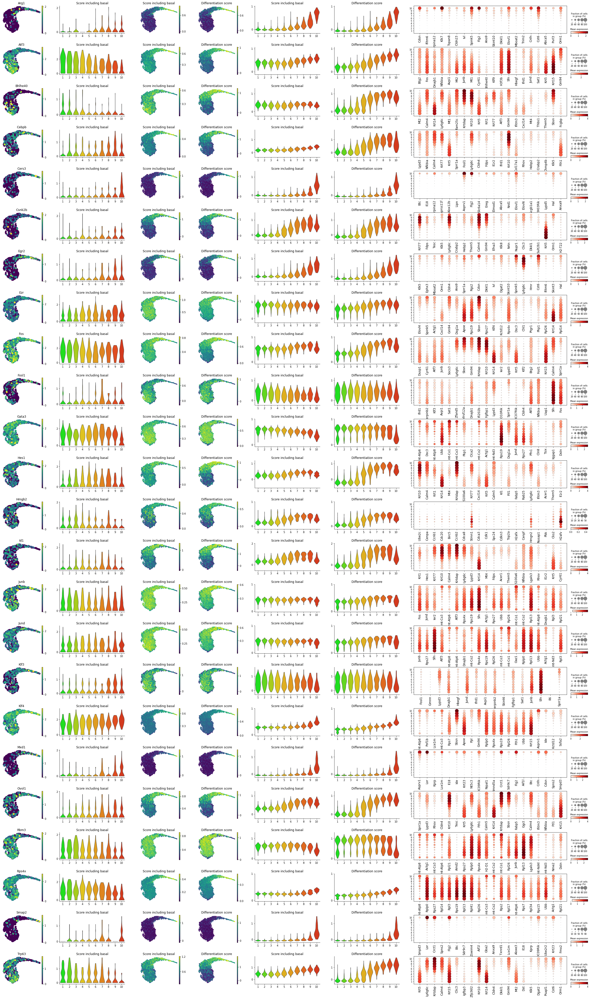

In [468]:
#tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1']

data_magic.obs['binned_delamination'] = data_magic.obs['binned_delamination'].apply(lambda x: int(float(x)))
#scores_sel = scores
scores_sel = sorted(set([g for g in tfs if f'{g}_score_diff' in data_magic.obs]))
width_ratios = [1, 1.5, 1, 1, 1.5, 1.5, 4]
ncols = len(width_ratios)
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (6*ncols, 3*nrows), gridspec_kw = {'width_ratios': width_ratios, 'hspace': 0.5, 'wspace': 0.2})
for ix, g in enumerate(scores_sel):
    score = f'{g}_score_diff'
    ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:20]
    
    col=0
    ax = axes[ix, col]
    sc.pl.umap(data_magic[data_magic.obs['batch']=='C1'].copy(), color = g, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title(g)
    col+=1
    
    ax = axes[ix, col]
    #ax.axhline(0, ls = ':', c = 'lightgray', zorder = -1)
    sc.pl.violin(data_magic[data_magic.obs['batch']=='C1'].copy(), groupby = 'binned_delamination', keys = [g], show = False, ax = ax, palete = c, stripplot = False, linewidth = 1)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    #ylim = ax.get_ylim()
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0)
    ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title('Score including basal')
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_xticklabels([int(float(x.get_text())) for x in ax.get_xticklabels()])
    ax.set_ylabel('')
    ax.set_xlabel('')
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    col+=1
    
    ax = axes[ix, col]
    sc.pl.umap(data_magic, color=f'{g}_score', show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_title('Score including basal')
    col+=1
    
    ax = axes[ix, col]
    sc.pl.umap(data_magic, color=score, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_title('Differentiation score')
    col+=1
    
    ax = axes[ix, col]
    #ax.axhline(0, ls = ':', c = 'lightgray', zorder = -1)
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [f'{g}_score'], show = False, ax = ax, palete = c, stripplot = False, linewidth = 1)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    #ylim = ax.get_ylim()
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0)
    #ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title('Score including basal')
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_xticklabels([int(float(x.get_text())) for x in ax.get_xticklabels()])
    ax.set_ylabel('')
    ax.set_xlabel('')
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    ylim1 = ax.get_ylim()
    col+=1
    
    
    ax = axes[ix, col]
    #ax.axhline(0, ls = ':', c = 'lightgray', zorder = -1)
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = ax, palete = c, stripplot = False, linewidth = 1)
    #sbn.violinplot(data = data_magic.obs, y = 'binned_delamination', x = score, order = order, inner = None, palette = c, ax = ax, scale = 'width')
    #ylim = ax.get_ylim()
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    #ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0)
    #ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title('Differentiation score')
    #ax.set_title('Target gene score' if ix == 0 else '')
    ax.set_xticklabels([int(float(x.get_text())) for x in ax.get_xticklabels()])
    ax.set_ylabel('')
    ax.set_xlabel('')
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    ylim2 = ax.get_ylim()
    
    ylims = list(zip(*[ylim1, ylim2]))
    ylim = [min(ylims[0]), max(ylims[1])]
    ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax = axes[ix, col-1]
    ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    col+=1
    
    ax = axes[ix, col]
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    im = sc.pl.dotplot(data_magic, var_names = ts, groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = ax, show = False, categories_order = order, colorbar_title = 'Mean expression', figsize = (15, 5))
    im['mainplot_ax'].set_xticklabels(im['mainplot_ax'].get_xticklabels(), rotation = 90, horizontalalignment = 'center', fontsize = 12)
    im['color_legend_ax'].set_xlim(left = 0)
    im['color_legend_ax'].xaxis.set_major_locator(MaxNLocator(3, integer=True))
    #ax.set_title('Target gene expression' if ix == 0 else '')
    
    #axes[ix, 1].set_xlabel('')
    #axes[ix, 3].set_xlabel('')
    clear_output()
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_Scores_Excluding-basal_Expression_plots_v4_TF-expression-by-C1-data.pdf'), bbox_inches = 'tight')

## Figure S7B

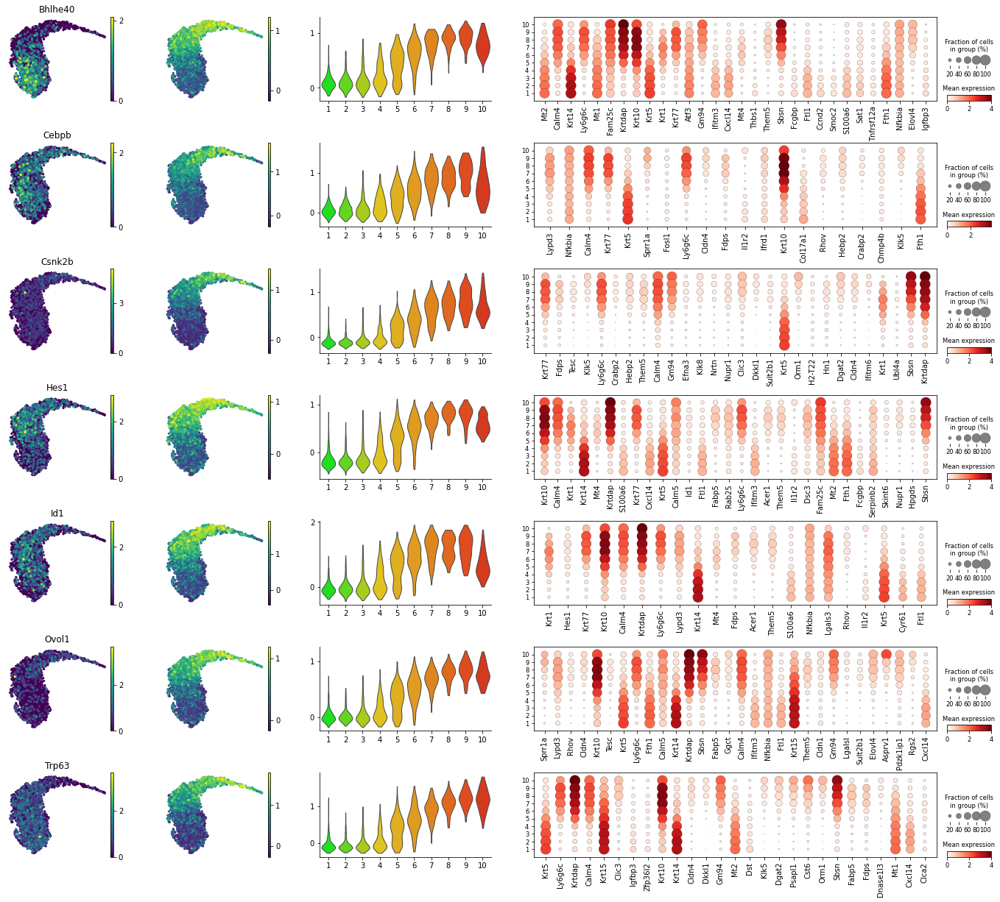

In [481]:
tfs = ['Csnk2b', 'Cebpb', 'Trp63', 'Ovol1', 'Id1', 'Hes1', 'Bhlhe40']

data_magic.obs['binned_delamination'] = data_magic.obs['binned_delamination'].apply(lambda x: int(float(x)))
#scores_sel = scores
scores_sel = sorted(set([g for g in tfs if f'{g}_score_diff' in data_magic.obs]))
width_ratios = [1, 1, 1.5, 4]
ncols = len(width_ratios)
nrows = len(scores_sel)
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (6*ncols, 3*nrows), gridspec_kw = {'width_ratios': width_ratios, 'hspace': 0.5, 'wspace': 0.2})
for ix, g in enumerate(scores_sel):
    score = f'{g}_score_diff'
    ts = adjacencies[(adjacencies['TF']==g) & (adjacencies['importance']>10)]['target'].values[:30]
    
    col=0
    ax = axes[ix, col]
    sc.pl.umap(data_magic, color = g, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title(g)
    col+=1
    
    ax = axes[ix, col]
    sc.pl.umap(data_magic, color=score, show = False, ax = ax, frameon = False)
    cbar = ax.collections[-1].colorbar
    cbar.ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_title('')
    col+=1
    
    
    ax = axes[ix, col]
    sc.pl.violin(data_magic, groupby = 'binned_delamination', keys = [score], show = False, ax = ax, palete = c, stripplot = False, linewidth = 1)
    ylim = ax.get_ylim()
    ax.set_ylim(bottom = ylim[0] if ylim[0] < 0 else 0, top = ylim[1] if ylim[1]>1 else 1)
    ax.yaxis.set_major_locator(MaxNLocator(2, integer=True, min_n_ticks = 2))
    ax.set_xticklabels([int(float(x.get_text())) for x in ax.get_xticklabels()])
    ax.set_ylabel('')
    ax.set_xlabel('')
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    col+=1
    
    ax = axes[ix, col]
    order = sorted(data_magic.obs['binned_delamination'].unique(), reverse = True)
    im = sc.pl.dotplot(data_magic, var_names = ts, groupby = 'binned_delamination', use_raw = True, swap_axes=False, ax = ax, show = False, categories_order = order, colorbar_title = 'Mean expression', figsize = (15, 5))
    im['mainplot_ax'].set_xticklabels(im['mainplot_ax'].get_xticklabels(), rotation = 90, horizontalalignment = 'center', fontsize = 10)
    im['color_legend_ax'].set_xlim(left = 0)
    im['color_legend_ax'].xaxis.set_major_locator(MaxNLocator(3, integer=True))
    
fig.savefig(os.path.join(fig_path, 'TF_Target-gene_Scores_Excluding-basal_Expression_plots_v5.pdf'), bbox_inches = 'tight')